##Load CSV

In [ ]:
import pandas as pd
pd.set_option('display.float_format', '{:.2f}'.format) #get non scientic notation

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Bootcamp ML/Capstone/Project_Crypto_DeFi_Clustering/data/raw/final_df_ungrouped.csv")
df = df[df["project"]=="uniswap"]
df.head()

,tx_from,tx_from_address_type,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,project,transaction_type
0,0xb58555fcba6479fced7de1485eb054943a09af7b,EOA,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97,uniswap,swap
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,EOA,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44,uniswap,swap
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,EOA,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68,uniswap,swap
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,EOA,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12,uniswap,swap
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,EOA,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65,uniswap,swap


In [ ]:
#for just uniswap protocol, the following columns have the same entries all the time: EOA, Uniswap, Swap -> drop these columns
df.drop(["tx_from_address_type", "transaction_type", "project"], axis =1, inplace = True)

<ipython-input-3-ab4d664ec5f5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(["tx_from_address_type", "transaction_type", "project"], axis =1, inplace = True)


##Exploratory Data Analysis & Data Preprocessing

In [ ]:
df.head()

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65


###Inspect the original df

In [ ]:
df.shape

(396580, 8)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 396580 entries, 0 to 466386
Data columns (total 8 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   tx_from                        396580 non-null  object 
 1   tx_count                       396580 non-null  float64
 2   distinct_token_count_in_txs    396580 non-null  int64  
 3   total_usd_amount_transacted    396580 non-null  float64
 4   avg_usd_amount_transacted      396580 non-null  float64
 5   active_months                  396580 non-null  int64  
 6   monthly_txns_count             396580 non-null  int64  
 7   monthly_usd_amount_transacted  396580 non-null  float64
dtypes: float64(4), int64(3), object(1)
memory usage: 27.2+ MB


In [ ]:
df.dtypes

tx_from                           object
tx_count                         float64
distinct_token_count_in_txs        int64
total_usd_amount_transacted      float64
avg_usd_amount_transacted        float64
active_months                      int64
monthly_txns_count                 int64
monthly_usd_amount_transacted    float64
dtype: object

###Handling missing values in original df

It's generally a good idea to handle missing values before aggregating the data. This is because the method you choose to handle missing values can impact the results of the aggregation.

In [ ]:
df.isna().sum()

tx_from                          0
tx_count                         0
distinct_token_count_in_txs      0
total_usd_amount_transacted      0
avg_usd_amount_transacted        0
active_months                    0
monthly_txns_count               0
monthly_usd_amount_transacted    0
dtype: int64

In [ ]:
#Handle missing values before aggregating the data

#Calculate the mean of each column
mean_total_usd = df['total_usd_amount_transacted'].mean()
mean_avg_usd = df['avg_usd_amount_transacted'].mean()
mean_monthly_usd = df['monthly_usd_amount_transacted'].mean()

# Fill missing values with the mean
df['total_usd_amount_transacted'].fillna(mean_total_usd, inplace=True)
df['avg_usd_amount_transacted'].fillna(mean_avg_usd, inplace=True)
df['monthly_usd_amount_transacted'].fillna(mean_monthly_usd, inplace=True)

df.isna().sum()

tx_from                          0
tx_count                         0
distinct_token_count_in_txs      0
total_usd_amount_transacted      0
avg_usd_amount_transacted        0
active_months                    0
monthly_txns_count               0
monthly_usd_amount_transacted    0
dtype: int64

In [ ]:
df["tx_from"].isna().sum()

0

In [ ]:
empty_strings = (df['tx_from'] == '').sum()
whitespace_strings = (df['tx_from'].str.strip() == '').sum()

print(empty_strings)
print(whitespace_strings)

0
0


###Duplicates

In [ ]:
#duplicates for all columns
for column in df.columns:
  print("-------------------------------")
  print(f"Duplicates for Column {column}")
  duplicates = df[column].duplicated()
  print(duplicates.sum())


-------------------------------
Duplicates for Column tx_from
0
-------------------------------
Duplicates for Column tx_count
394669
-------------------------------
Duplicates for Column distinct_token_count_in_txs
396251
-------------------------------
Duplicates for Column total_usd_amount_transacted
301
-------------------------------
Duplicates for Column avg_usd_amount_transacted
313
-------------------------------
Duplicates for Column active_months
396548
-------------------------------
Duplicates for Column monthly_txns_count
395848
-------------------------------
Duplicates for Column monthly_usd_amount_transacted
303


In [ ]:
#duplicates for other rows
df.duplicated() #no rows that are the same

#duplicates for each columns and respective value counts of duplication
for column in df.columns:
  print("-------------------------------")
  print(f"Duplicates for Column {column}")
  duplicates = df[column].value_counts()>1
  print(df[column].value_counts()[duplicates])


-------------------------------
Duplicates for Column tx_from
Series([], Name: tx_from, dtype: int64)
-------------------------------
Duplicates for Column tx_count
1.00       123259
2.00        75837
3.00        33723
4.00        26915
5.00        16591
            ...  
3536.00         2
761.00          2
645.00          2
1144.00         2
1387.00         2
Name: tx_count, Length: 868, dtype: int64
-------------------------------
Duplicates for Column distinct_token_count_in_txs
1      165471
2       88284
3       42357
4       23923
5       15934
        ...  
216         2
269         2
212         2
186         2
260         2
Name: distinct_token_count_in_txs, Length: 204, dtype: int64
-------------------------------
Duplicates for Column total_usd_amount_transacted
42766.05    6
18280.00    5
34576.30    4
17760.00    4
44799.40    4
           ..
18498.34    2
20004.24    2
18834.30    2
17732.80    2
18495.10    2
Name: total_usd_amount_transacted, Length: 258, dtype: int64
-

In [ ]:
counts = df['tx_from'].value_counts()[df['tx_from'].value_counts() > 1]
print(f"we have {len(counts.index)} different addresses that appear more than once")

we have 0 different addresses that appear more than once


In [ ]:
# Print the number of unique 'tx_from' values before the groupby operation
print("total rows in tx_from ", len(df["tx_from"]))
print("unique addresses", df['tx_from'].nunique())
print("duplicated addresses", len(df) -  df['tx_from'].nunique() )

total rows in tx_from  396580
unique addresses 396580
duplicated addresses 0


###Anomaly detection

####Mathematically

In [ ]:
# 1. Select only numerical columns. Assuming 'tx_from' is the categorical column you were referring to.
numerical_df = df.drop(columns=['tx_from'])

# 2. Calculate Q1, Q3, IQR, lower_bound, and upper_bound for numerical columns.
Q1 = numerical_df.quantile(0.25)
Q3 = numerical_df.quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# 3. Get a boolean dataframe indicating where the outliers are.
outliers_mask = (numerical_df < lower_bound) | (numerical_df > upper_bound)

# 4. Create mask to get rows with any outliers
outliers_rows_mask = outliers_mask.any(axis=1)

# Extracting dataframe with rows containing at least one outlier
df_outliers = df[outliers_rows_mask].copy()

# Extracting dataframe with rows without any outliers
df_no_outliers = df[~outliers_rows_mask].copy()

In [ ]:
df_outliers

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65
...,...,...,...,...,...,...,...,...
266298,0xc0d5445b157bdccca8a3ffe6761925cf9fc97df7,4.00,2,78286.41,19571.60,4,1,19571.60
267050,0x00e5753e5e8a5c1f3be40392495446477edac73c,4.00,3,77824.35,19456.09,4,1,19456.09
267065,0xbac38d103ef7ccfa5b38a660086616d226ae7597,4.00,1,77816.14,19454.03,4,1,19454.03
267436,0x9e80e9918cef5681c9aec9dcce455ca3b8d69569,4.00,3,77566.39,19391.60,4,1,19391.60


In [ ]:
df_no_outliers

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
71771,0x15dd416f5e624979981667c50b1518755efbb398,11.00,5,796361.38,72396.49,3,3,265453.79
71801,0x8b77f00754f2b7a4a64fd18ee4db6f4e3c9c47b3,14.00,2,795927.81,56851.99,3,4,265309.27
71857,0x7d3cd3ebd88a9dca5b3e9d09fd1600db81fd8b20,11.00,2,795055.96,72277.81,3,3,265018.65
71870,0xba6f5d62b33479a487c2f0c9f80d9f9d0fa249bd,9.00,6,794695.87,88299.54,3,3,264898.62
71876,0x9a661d197ed337cd724a6fa90c9d2c4b7ca6c9ab,13.00,5,794592.93,61122.53,3,4,264864.31
...,...,...,...,...,...,...,...,...
466382,0xfbc6f39da71d22e800f921e4b912913c00124332,1.00,1,17726.70,17726.70,1,1,17726.70
466383,0xd443fc34d51badcb7118a97e452f8776a39d3403,1.00,1,17726.66,17726.66,1,1,17726.66
466384,0x0d93b6922d47b148d24dd05456ef85a8be46ee89,1.00,1,17726.60,17726.60,1,1,17726.60
466385,0xce3ee9c115d7e817b25809b4acab8227f5620519,1.00,1,17726.59,17726.59,1,1,17726.59


In [ ]:
df_no_outliers.describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
count,278992.00,278992.00,278992.00,278992.00,278992.00,278992.00,278992.00
mean,2.69,1.72,92038.50,32662.11,1.36,1.82,63203.65
std,2.35,1.08,100038.61,15218.22,0.62,1.15,52285.48
min,1.00,0.00,17726.54,17726.54,1.00,1.00,17726.54
25%,1.00,1.00,28821.27,21563.13,1.00,1.00,26613.41
50%,2.00,1.00,54941.41,27290.41,1.00,1.00,45158.10
75%,3.00,2.00,113126.20,38579.75,2.00,2.00,79344.40
max,16.00,6.00,796361.38,91275.42,3.00,6.00,361088.22


####after logtransformation of data

In [ ]:
import numpy as np
numerical_df = df.drop(columns=['tx_from'])
numerical_df_log = numerical_df.apply(lambda x: np.log(x+ 1))
# 2. Calculate Q1, Q3, IQR, lower_bound, and upper_bound for numerical columns.
Q1 = numerical_df_log.quantile(0.25)
Q3 = numerical_df_log.quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# 3. Get a boolean dataframe indicating where the outliers are.
outliers_mask = (numerical_df_log < lower_bound) | (numerical_df_log > upper_bound)

# 4. Create mask to get rows with any outliers
outliers_rows_mask = outliers_mask.any(axis=1)

# Extracting dataframe with rows containing at least one outlier
df_outliers_log = df[outliers_rows_mask].copy()

# Extracting dataframe with rows without any outliers
df_no_outliers_log = df[~outliers_rows_mask].copy()

In [ ]:
df_no_outliers_log.describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
count,326880.00,326880.00,326880.00,326880.00,326880.00,326880.00,326880.00
mean,3.73,2.00,157488.38,38264.21,1.50,2.16,91257.28
std,4.41,1.51,265927.25,25192.03,0.83,1.73,113094.44
min,1.00,0.00,17726.54,17726.54,1.00,1.00,17726.54
25%,1.00,1.00,33894.46,22254.52,1.00,1.00,29665.71
50%,2.00,1.00,69092.92,29033.12,1.00,2.00,52575.05
75%,4.00,2.00,165678.99,43419.05,2.00,2.00,104429.42
max,43.00,10.00,6719291.07,160974.33,4.00,10.00,1679822.77


####Visually

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import scipy.stats as st

with mathematically defined outliers

In [ ]:
sample_num_no_outliers = df_no_outliers.sample(n=1000).select_dtypes(exclude="object")

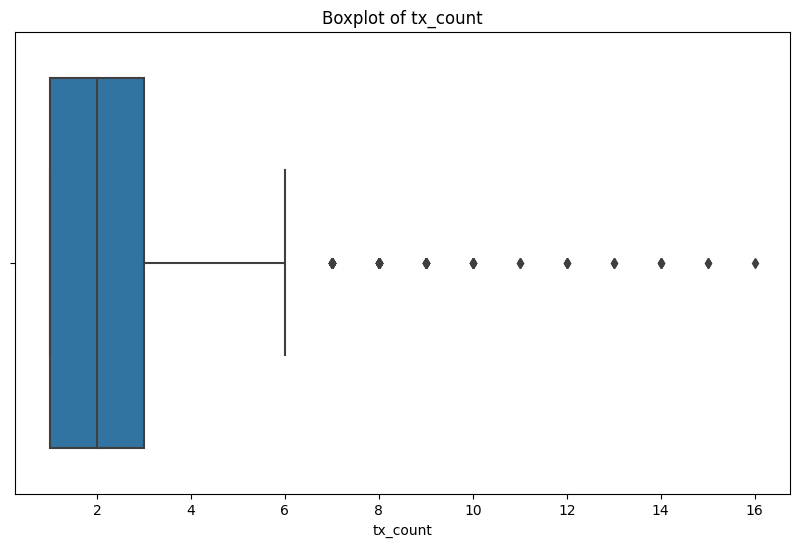

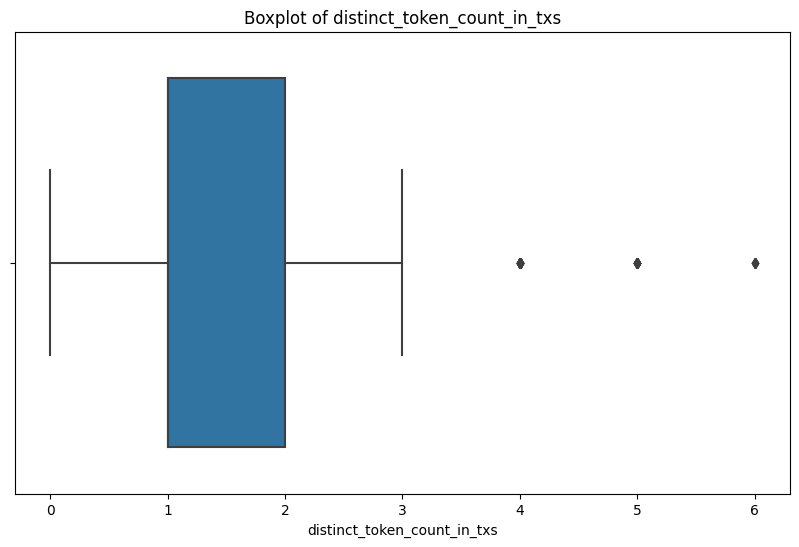

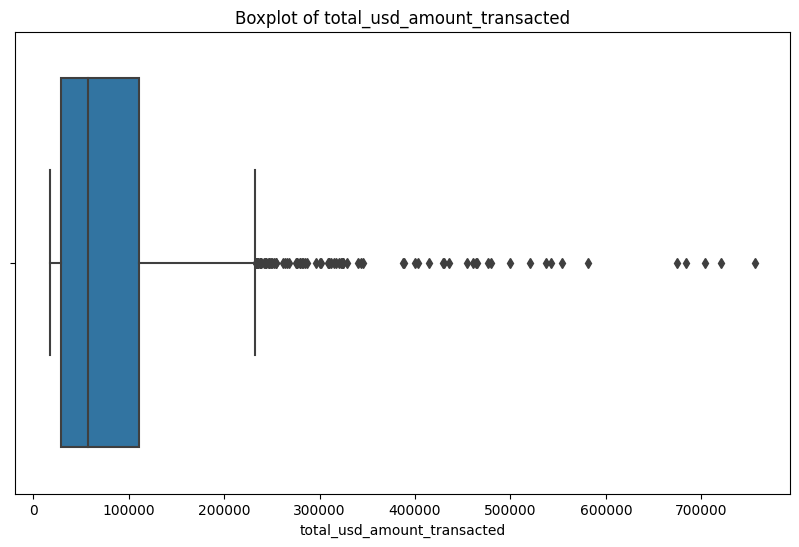

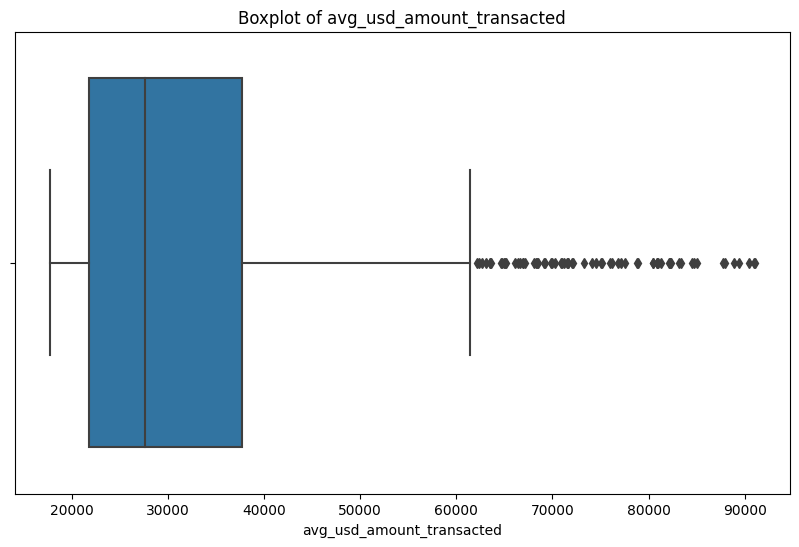

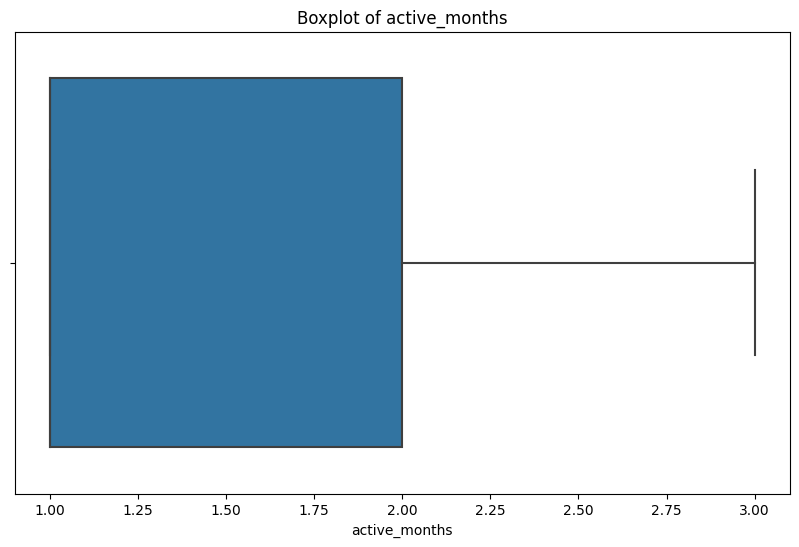

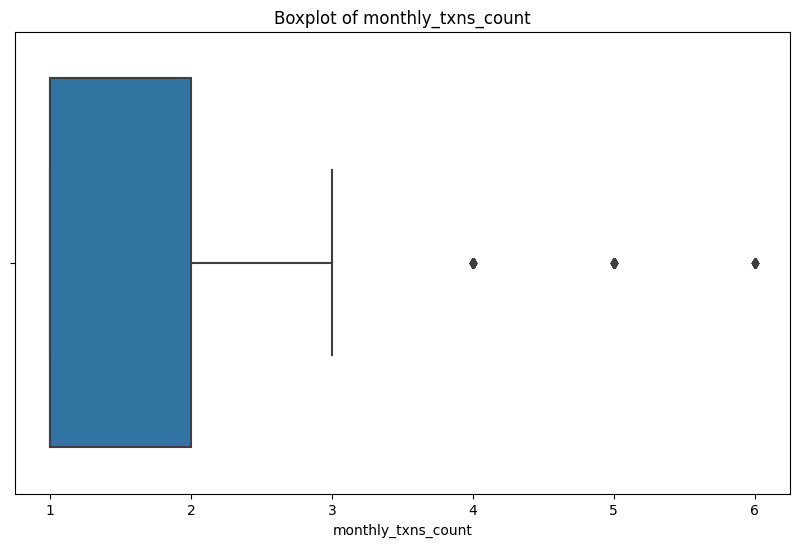

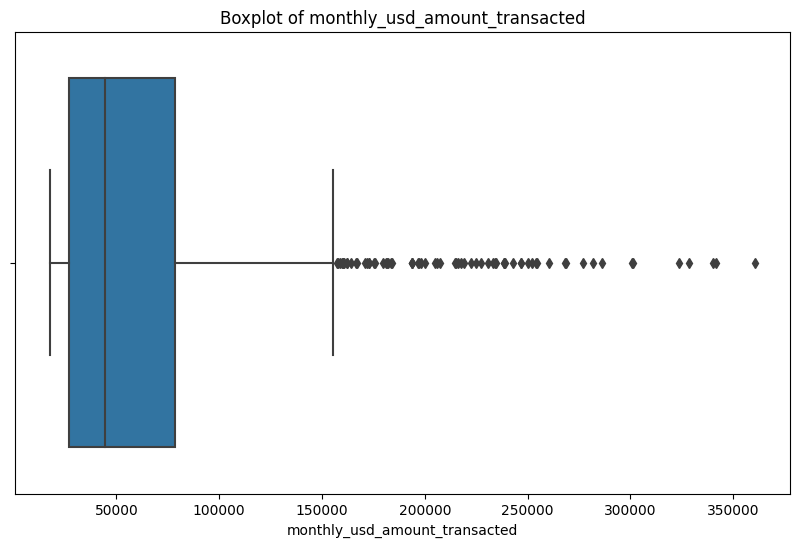

In [ ]:
for feature in sample_num_no_outliers.columns:
    plt.figure(figsize=(10,6))
    sns.boxplot(x=sample_num_no_outliers[feature])
    plt.title(f'Boxplot of {feature}')
    plt.show()


without mathematically defined outliers

In [ ]:
#sample from df without outliers above
sample = df.sample(n=1000)
sample_num = sample.select_dtypes(exclude="object")

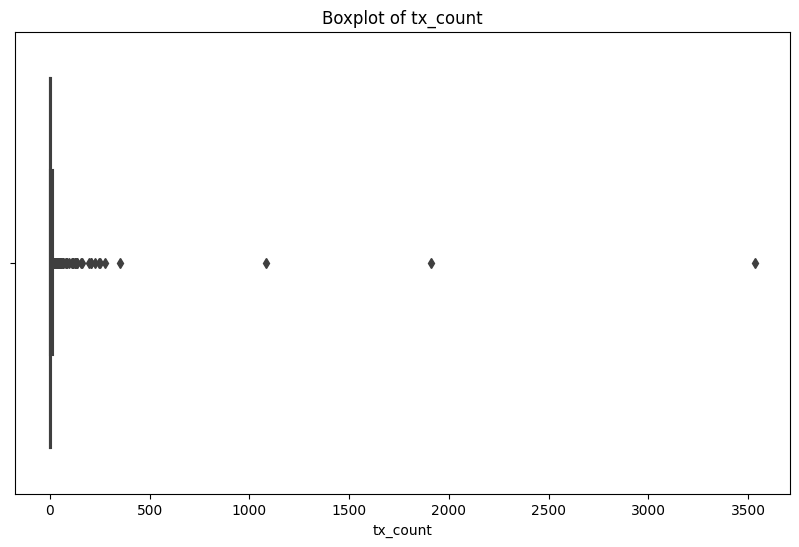

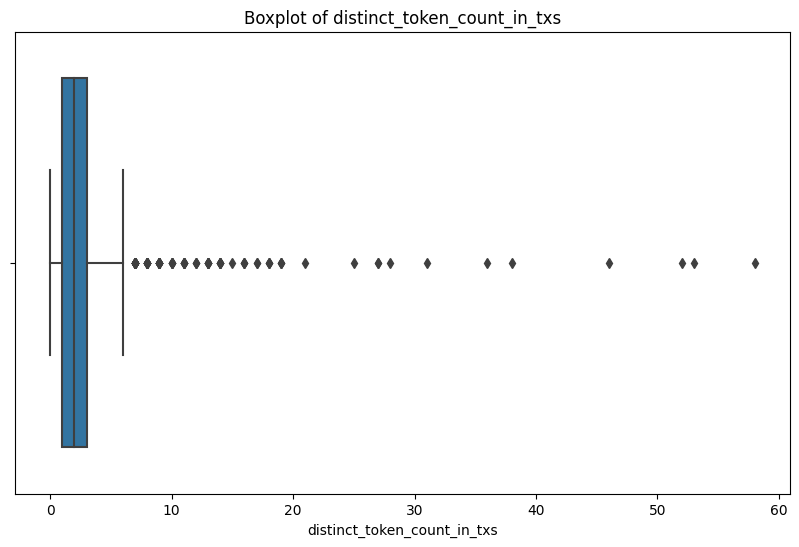

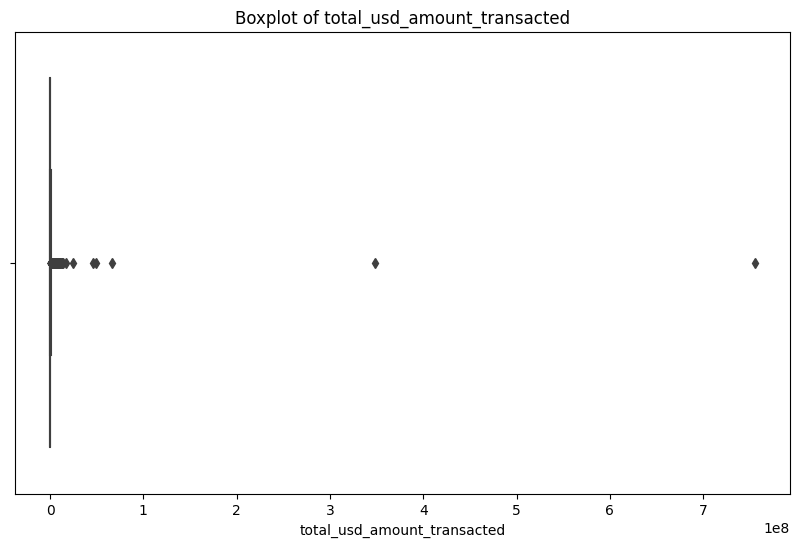

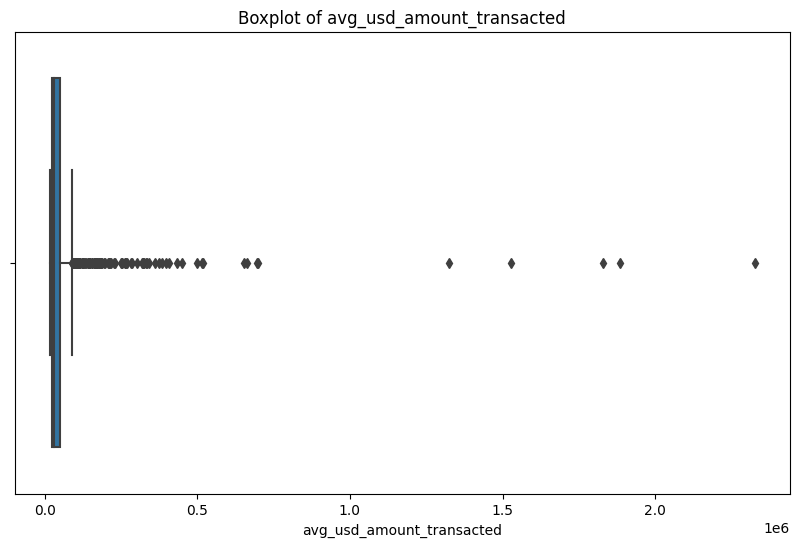

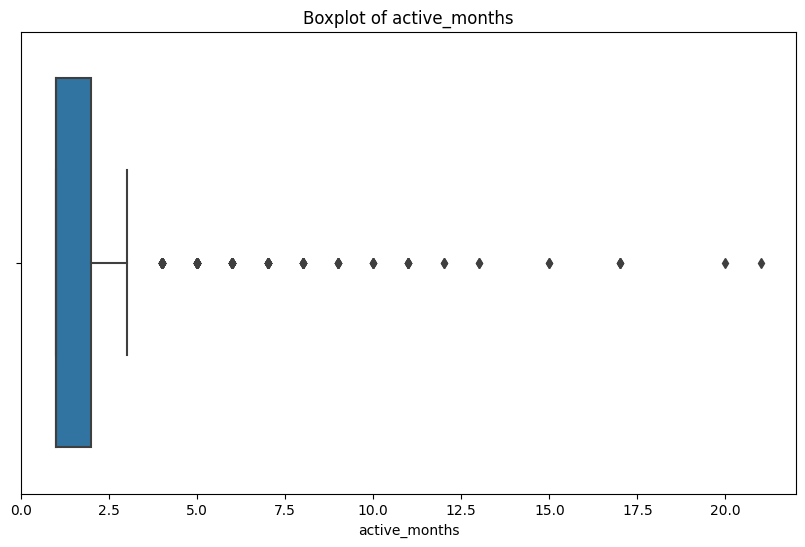

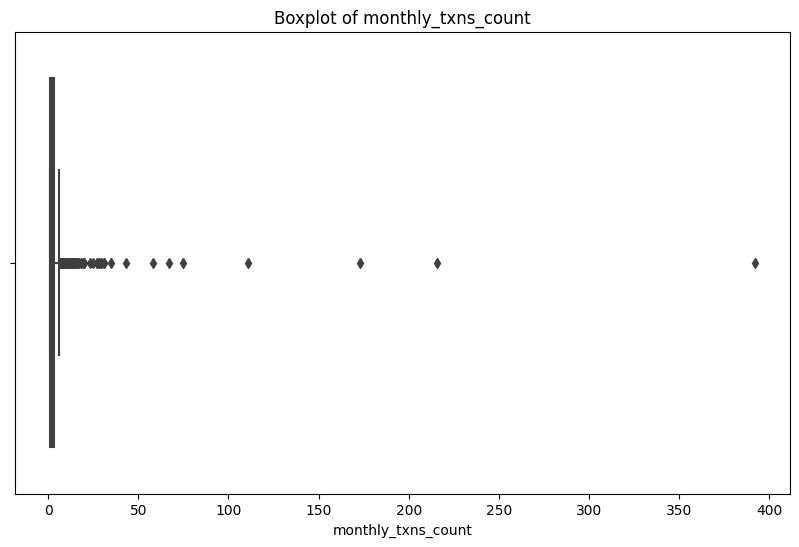

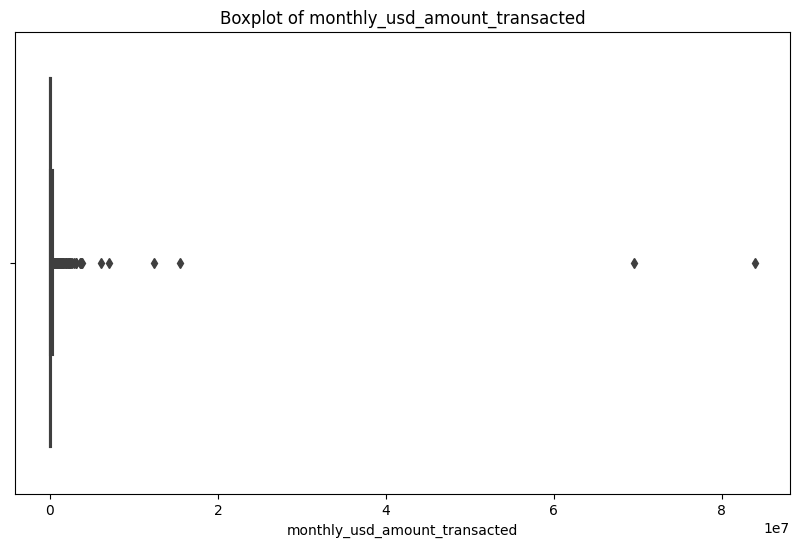

In [ ]:
#boxplot and or scatterplots
for feature in sample_num.columns:
    plt.figure(figsize=(10,6))
    sns.boxplot(x=sample_num[feature])
    plt.title(f'Boxplot of {feature}')
    plt.show()





#maybe also looking into anomaly detection algorithms (after deadline, won't be part of initial presentation)

with mathematically defined outliers and log transformed data

In [ ]:
sample_no_outlier_log = df_no_outliers_log.sample(n=1000)
sample_no_outlier_log_num = sample_no_outlier_log.select_dtypes(exclude="object")

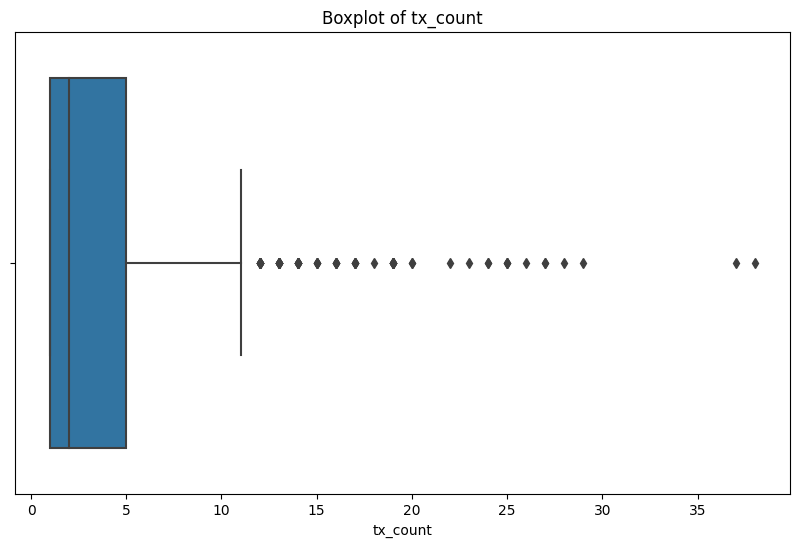

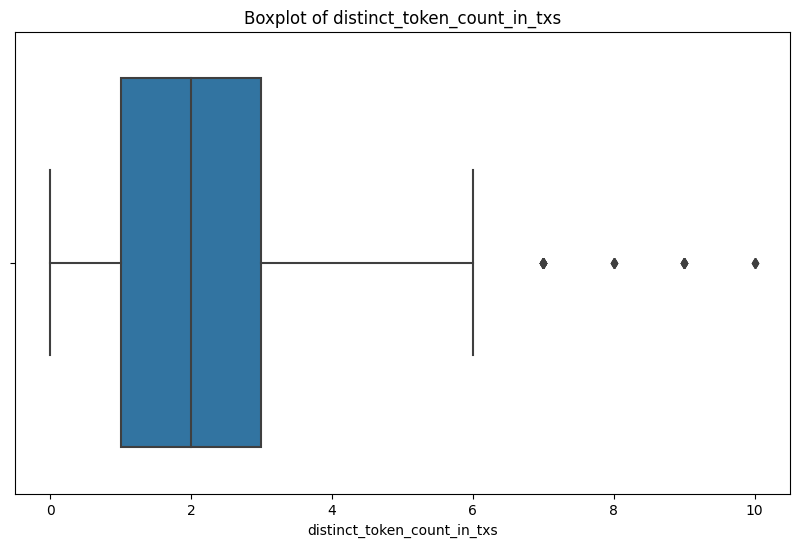

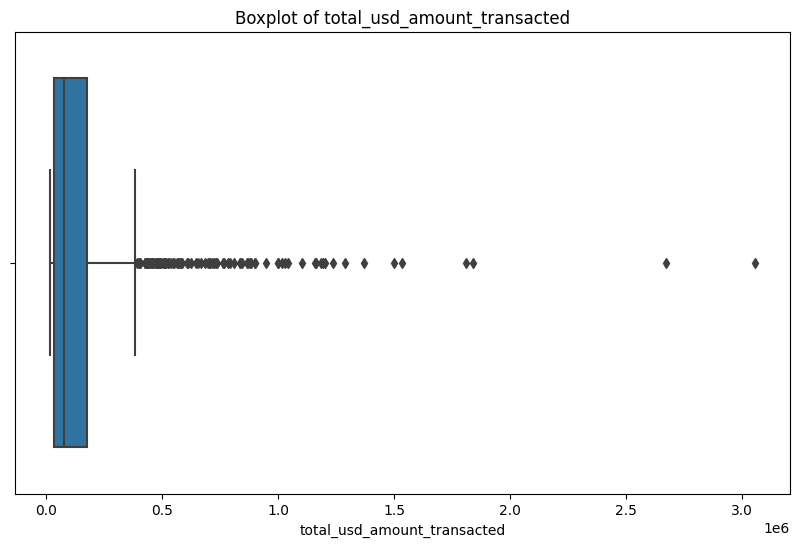

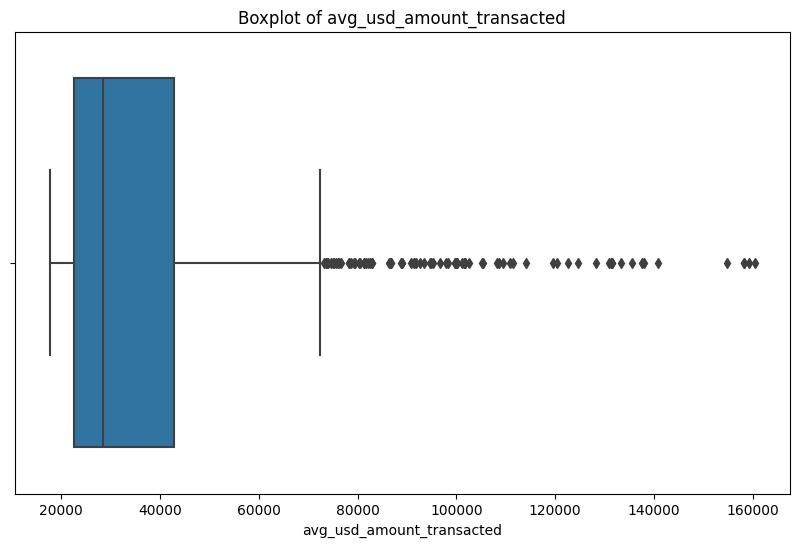

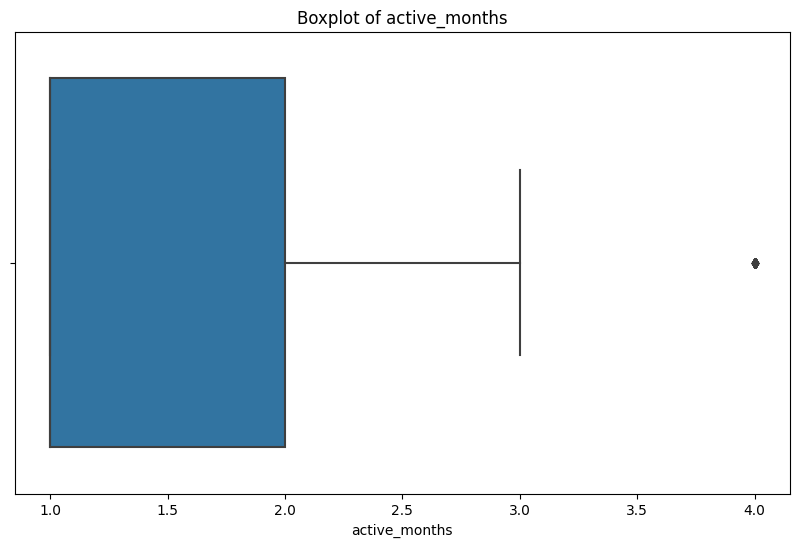

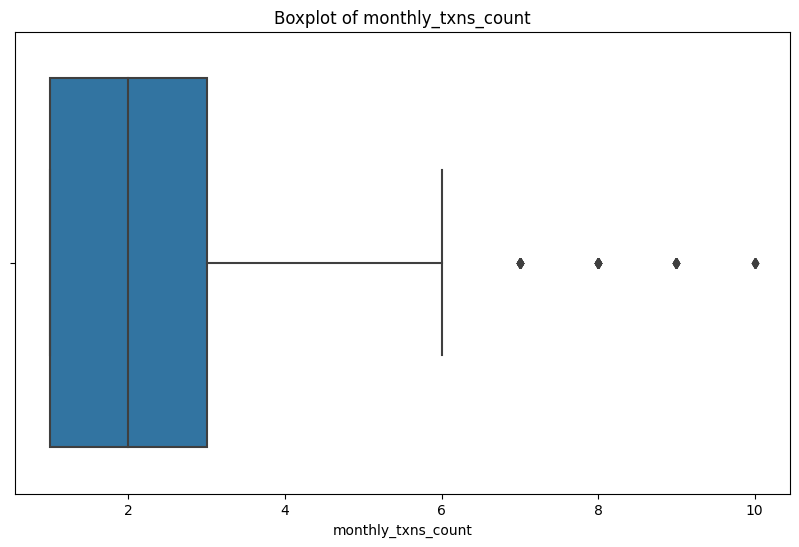

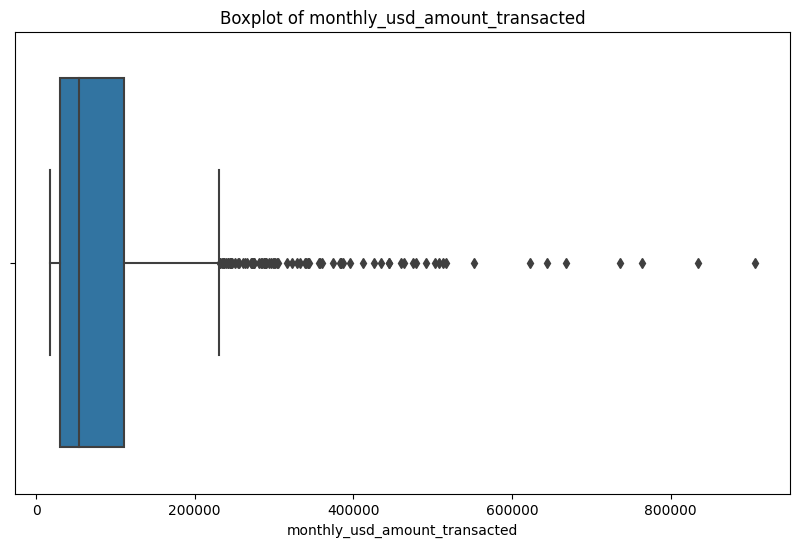

In [ ]:
for feature in sample_no_outlier_log_num.columns:
    plt.figure(figsize=(10,6))
    sns.boxplot(x=sample_no_outlier_log_num[feature])
    plt.title(f'Boxplot of {feature}')
    plt.show()


**Insights Anamoly Detection**

log transformation makes the data less skewed and hence larger values are included as non outliers. Going forward, I would suggest this transformation wherever possible.

###Visualization & Summary statistics

####Visualizing numerical variables

In [ ]:
sample_num_no_outliers

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
334911,1.00,1,44642.03,44642.03,1,1,44642.03
456892,1.00,1,18446.91,18446.91,1,1,18446.91
291468,2.00,1,62630.80,31315.40,1,2,62630.80
254695,3.00,2,86334.37,28778.12,2,1,43167.19
304810,2.00,2,56478.47,28239.24,1,2,56478.47
...,...,...,...,...,...,...,...
430314,1.00,1,20725.92,20725.92,1,1,20725.92
158909,5.00,1,219501.50,43900.30,3,1,73167.17
235999,4.00,2,100495.21,25123.80,2,2,50247.61
228406,4.00,2,107589.43,26897.36,2,2,53794.72


In [ ]:
sample_no_outlier_log_num

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
399819,1.00,1,25690.00,25690.00,1,1,25690.00
291152,1.00,1,62788.94,62788.94,1,1,62788.94
252455,3.00,2,88085.31,29361.77,1,3,88085.31
435225,1.00,1,20205.88,20205.88,1,1,20205.88
444696,1.00,1,19573.70,19573.70,1,1,19573.70
...,...,...,...,...,...,...,...
374132,1.00,1,33785.88,33785.88,1,1,33785.88
445207,1.00,1,19524.41,19524.41,1,1,19524.41
390322,1.00,1,28176.34,28176.34,1,1,28176.34
226838,2.00,1,109222.41,54611.21,1,2,109222.41


In [ ]:
#create a sns hist plot function i.e. histogram for the numerical values of my data:
def plot_distrib(sample):
  sample_num = sample.select_dtypes(exclude="object")
  num_columns = len(sample_num.columns)
  #if odd number of columns, add 1 to better create subplots
  if num_columns%2 == 1:
    adj_num_columns = num_columns+ 1

  fig, axes = plt.subplots(2, adj_num_columns//2, figsize = (70,50))
  for i, column in enumerate(sample_num.columns):
    ax = axes[i//(adj_num_columns//2),i%(adj_num_columns//2)]
    sns.histplot(sample[column], bins = 50, kde = True, ax = ax) #need to specify ax in the sns
    ax.set_title(column)
    ax.set_xlabel(column)
    ax.set_ylabel(column)
  # If num_columns is odd, remove the last (empty) subplot
  if num_columns % 2 == 1:
    fig.delaxes(axes.flatten()[-1]) #axes instance of matplotlib.subplot is a 2d array with 2x6 grid of subplots

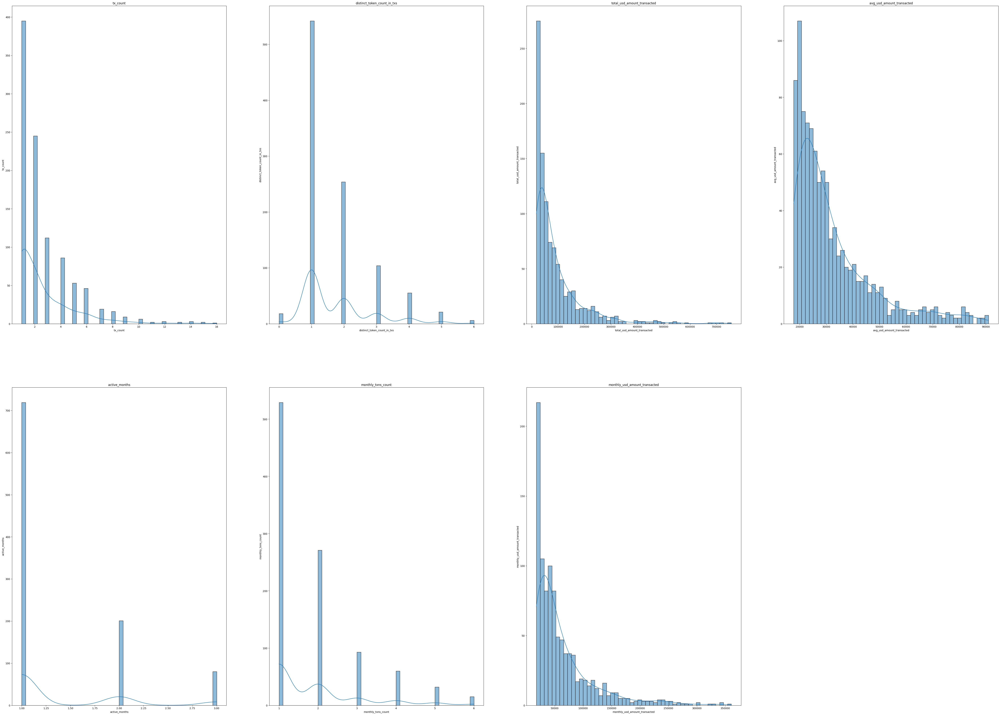

In [ ]:
plot_distrib(sample_num_no_outliers)

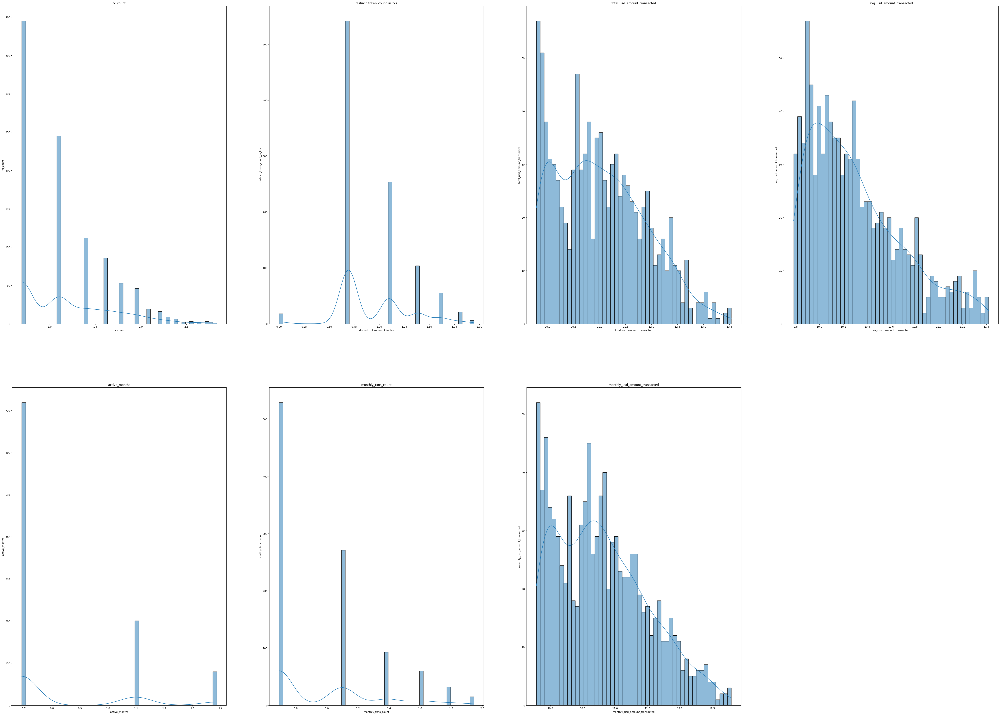

In [ ]:
plot_distrib(sample_num_no_outliers.apply(lambda x: np.log(x+ 1)))

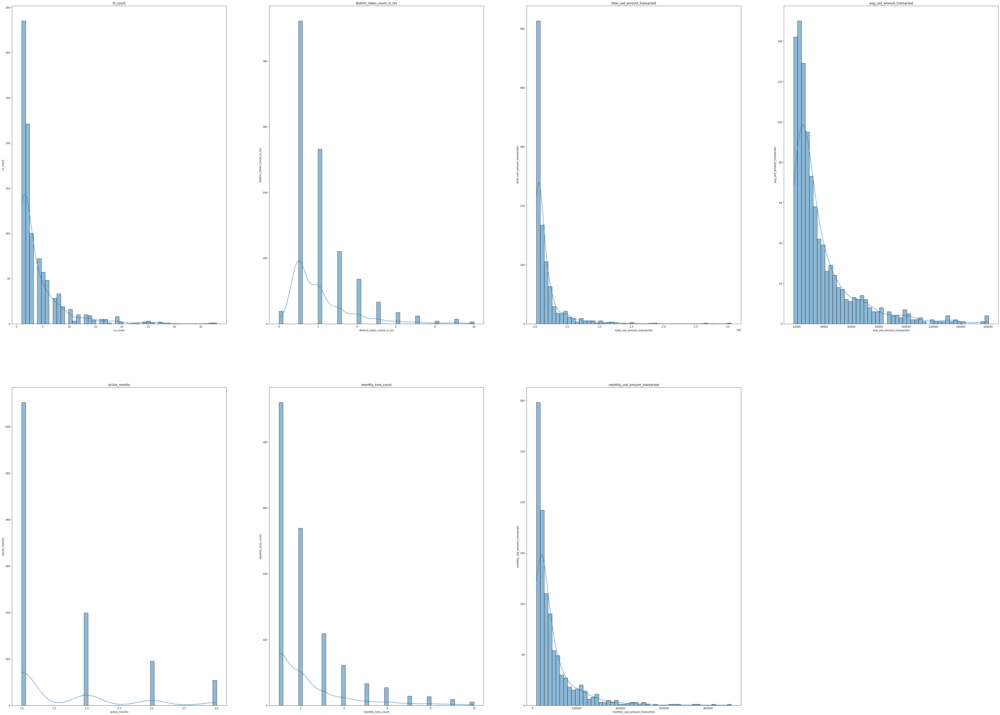

In [ ]:
#different when we sample from a log transformed data set

sample_no_outlier_log_num

plot_distrib(sample_no_outlier_log_num)




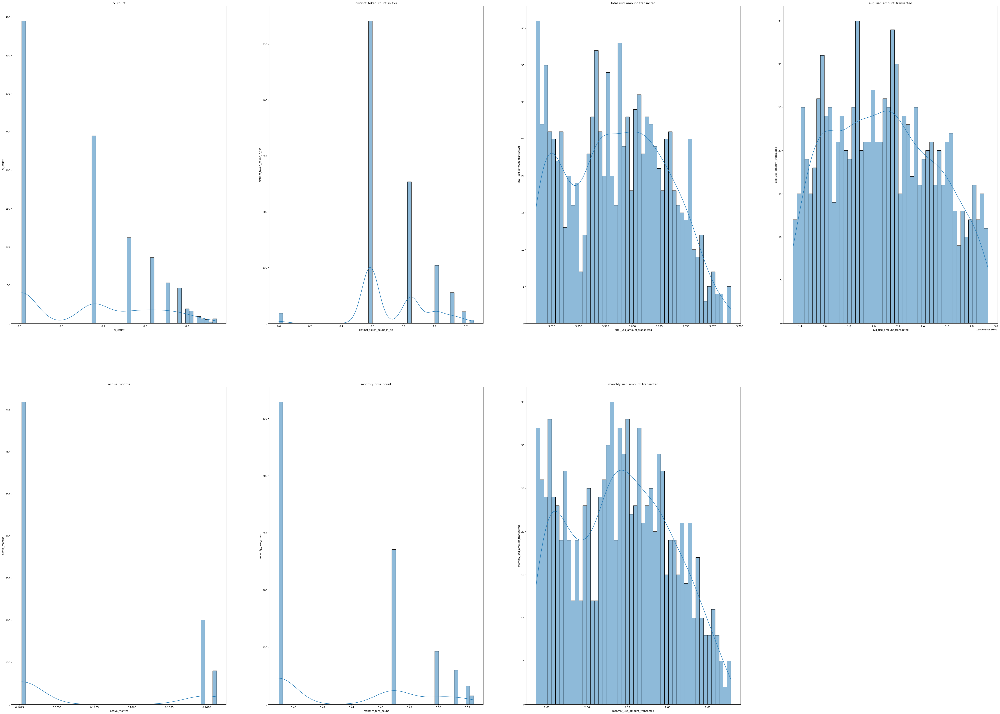

In [ ]:
#most of the numerical plots above are positively skewed.
#apply Box_Cox transformation
#data must be positive
# add a constant to make all values positive
sample_num_no_outliers_positive = sample_num_no_outliers - sample_num_no_outliers.min().min() + 1
bc_transformed_data = sample_num_no_outliers_positive.apply(lambda col: st.boxcox(col)[0])

plot_distrib(bc_transformed_data)

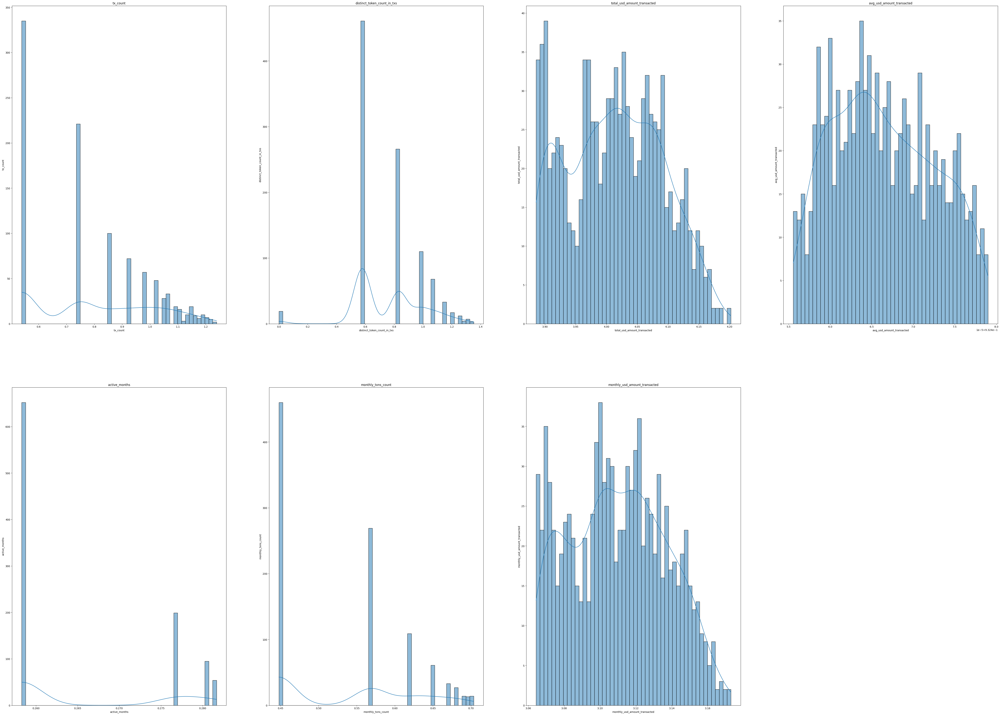

In [ ]:
sample_num_no_outliers_log_positive = sample_no_outlier_log_num - sample_no_outlier_log_num.min().min() + 1
bc_transformed_log_data = sample_num_no_outliers_log_positive.apply(lambda col: st.boxcox(col)[0])

plot_distrib(bc_transformed_log_data)

**Insights**:
* **The Box-Cox transformation seems now to be more suitable for my purpose!**
* **I like the log transformation the most as for total amount and avg amount (i.e. amount per transaction) we can see a distinction between addresses with lower, higher values, and outliers**

#### Visualizing categorical data in a barplot

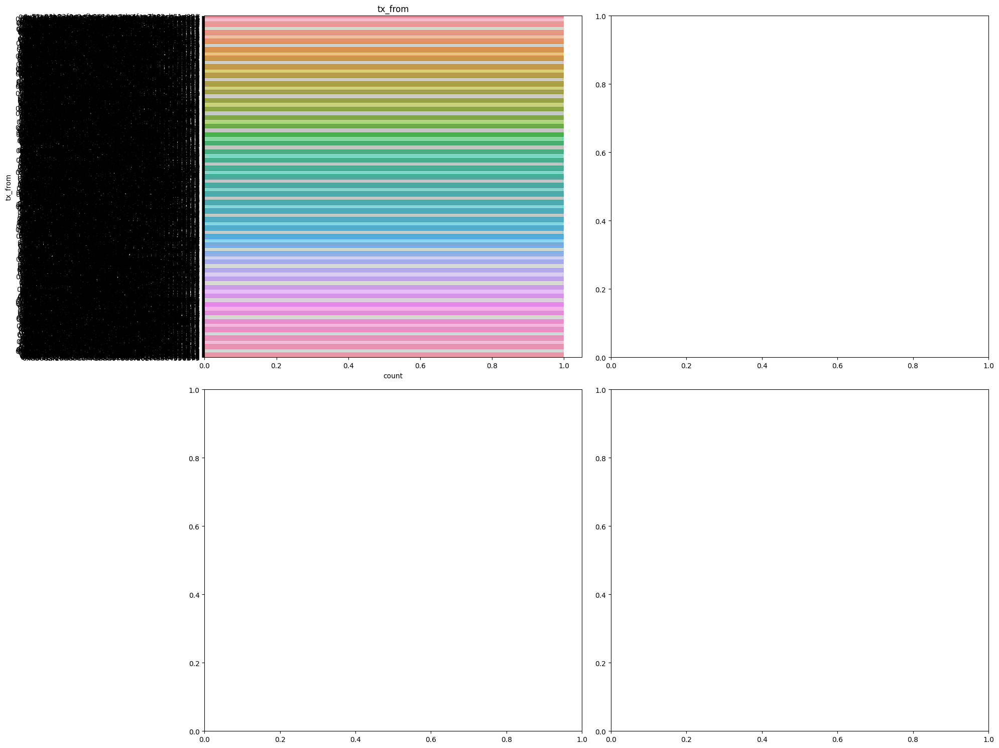

In [ ]:
categorical_features_sample_df = sample.select_dtypes(include=['object'])

fig, axes = plt.subplots(2, 2, figsize=(20,15))
axes = axes.flatten() #so I can initilize the counter without having to worry about which rows to choose i.e. just focus on the subplot 1 to 4
for i, column in enumerate(categorical_features_sample_df.columns):
  ax = axes[i]
  sns.countplot(y=categorical_features_sample_df[column], ax=ax)
  ax.set_title(column)

plt.tight_layout()
plt.show()

Insights:
* Tx_from has high cardinality -> engineer it so its insightful!
* **Remember: in the curated Uniswap dataset, each transaction is only initated by an EOA i.e. not by a contract! This would probably change, if we were to include flashloans from AAVE and MakerDAO (later)**

#####Insights on the top 20 addresses

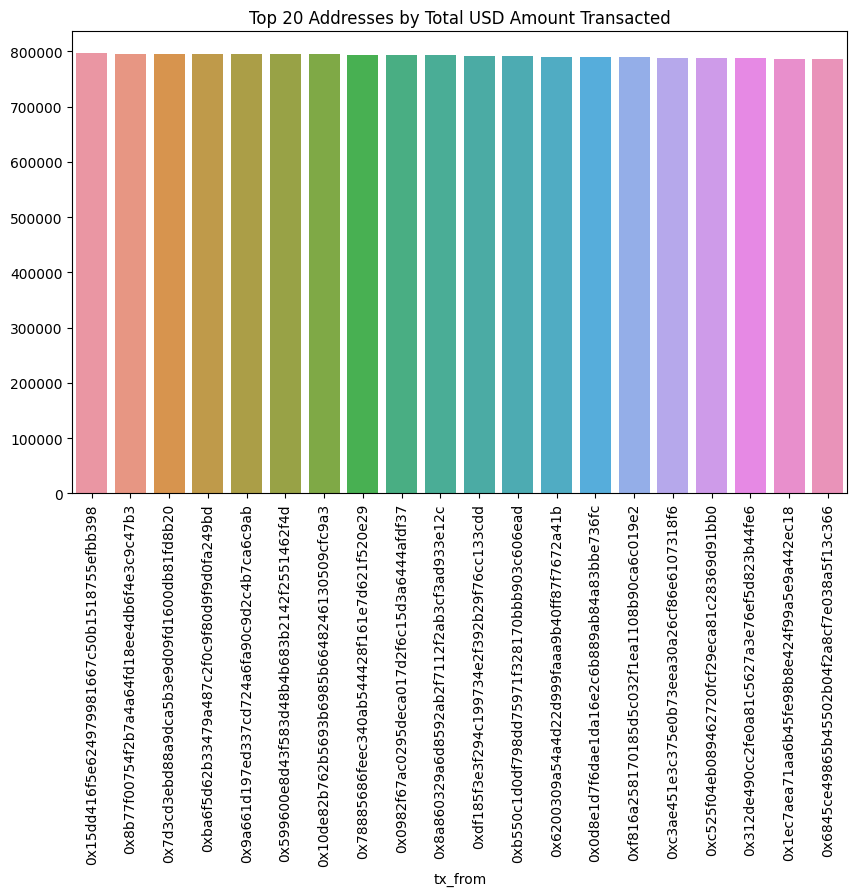

In [ ]:
#transaction volume by top addresses

top_addresses = df_no_outliers.groupby("tx_from")['total_usd_amount_transacted'].sum().sort_values(ascending=False).head(20)
plt.figure(figsize=(10,6))
sns.barplot(x=top_addresses.index,y= top_addresses.values)
plt.xticks(rotation=90)
plt.title('Top 20 Addresses by Total USD Amount Transacted')
plt.show()



In [ ]:
top_addresses

tx_from
0x15dd416f5e624979981667c50b1518755efbb398   796361.38
0x8b77f00754f2b7a4a64fd18ee4db6f4e3c9c47b3   795927.81
0x7d3cd3ebd88a9dca5b3e9d09fd1600db81fd8b20   795055.96
0xba6f5d62b33479a487c2f0c9f80d9f9d0fa249bd   794695.87
0x9a661d197ed337cd724a6fa90c9d2c4b7ca6c9ab   794592.93
0x599600e8d43f583d48b4b683b2142f2551462f4d   794535.04
0x10de82b762b5693b6985b6648246130509cfc9a3   794522.56
0x78885686feec340ab544428f161e7d621f520e29   793854.12
0x0982f67ac0295deca017d2f6c15d3a6444afdf37   793640.31
0x8a860329a6d8592ab2f7112f2ab3cf3ad933e12c   793067.51
0xdf185f3e3f294c199734e2f392b29f76cc133cdd   792325.04
0xb550c1d0df798dd75971f328170bbb903c606ead   790880.32
0x6200309a54a4d22d999faaa9b40ff87f7672a41b   790168.45
0x0d8e1d7f6dae1da16e2c6b889ab84a83bbe736fc   789890.81
0xf816a258170185d5c032f1ea1108b90ca6c019e2   789357.85
0xc3ae451e3c375e0b73eea30a26cf86e6107318f6   788791.16
0xc525f04eb089462720fcf29eca81c28369d91bb0   788282.60
0x312de490cc2fe0a81c5627a3e76ef5d823b44fe6   787247.50
0x

In [ ]:
f"The top 20 addresses contribute to nearly half of the total amount transacted, precisely: {((top_addresses.sum())/(np.sum(df_no_outliers['total_usd_amount_transacted']))) *100}% with a total of {top_addresses.sum()/10.00**9} billions"

'The top 20 addresses contribute to nearly half of the total amount transacted, precisely: 0.06167406046277479% with a total of 0.01583666827145415 billions'

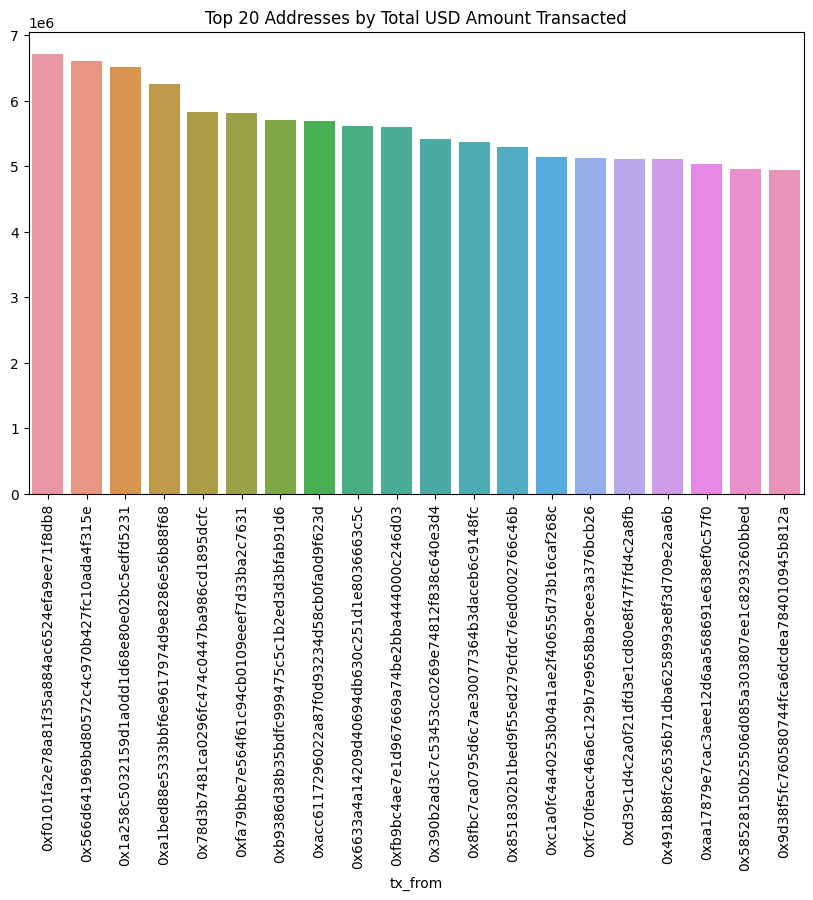

In [ ]:
#log data
top_addresses = df_no_outliers_log.groupby("tx_from")['total_usd_amount_transacted'].sum().sort_values(ascending=False).head(20)
plt.figure(figsize=(10,6))
sns.barplot(x=top_addresses.index,y= top_addresses.values)
plt.xticks(rotation=90)
plt.title('Top 20 Addresses by Total USD Amount Transacted')
plt.show()


In [ ]:
f"The top 20 addresses contribute to nearly half of the total amount transacted, precisely: {((top_addresses.sum())/(np.sum(df_no_outliers_log['total_usd_amount_transacted']))) *100}% with a total of {top_addresses.sum()/10.00**9} billions"

'The top 20 addresses contribute to nearly half of the total amount transacted, precisely: 0.21730950061353813% with a total of 0.11187050186885088 billions'

In [ ]:
top_addresses

tx_from
0xf0101fa2e78a81f35a884ac6524efa9ee71f8db8   6719291.07
0x566d641969bd80572c4c970b427fc10ada4f315e   6604208.79
0x1a258c5032159d1a0dd1d68e80e02bc5edfd5231   6512170.39
0xa1bed88e5333bbf6e9617974d9e8286e56b88f68   6257546.42
0x78d3b7481ca0296fc474c0447ba986cd1895dcfc   5836643.58
0xfa79bbe7e564f61c94cb0109eeef7d33ba2c7631   5807431.49
0xb9386d38b35bdfc999475c5c1b2ed3d3bfab91d6   5705886.12
0xacc6117296022a87f0d93234d58cb0fa0d9f623d   5697410.87
0x6633a4a14209d40694db630c251d1e8036663c5c   5622084.19
0xfb9bc4ae7e1d967669a74be2bba444000c246d03   5593457.55
0x390b2ad3c7c53453cc0269e74812f838c640e3d4   5410158.20
0x8fbc7ca0795d6c7ae30077364b3daceb6c9148fc   5366318.36
0x8518302b1bed9f55ed279cfdc76ed0002766c46b   5301680.09
0xc1a0fc4a40253b04a1ae2f40655d73b16caf268c   5144275.30
0xfc70feacc46a6c129b7e9658ba9cee3a376bcb26   5123840.49
0xd39c1d4c2a0f21dfd3e1cd80e8f47f7fd4c2a8fb   5111441.57
0x4918b8fc26536b71dba6258993e8f3d709e2aa6b   5104979.24
0xaa17879e7cac3aee12d6aa568691e638ef0c57

In [ ]:
#IMPORTANT: this df is the same as the one we created below as we do not have any address duplicates in just one protocol
df_top_20_total_amount_addresses = df_no_outliers_log[df_no_outliers_log["tx_from"].isin(top_addresses.index.tolist())]
df_top_20_total_amount_addresses

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
14183,0xf0101fa2e78a81f35a884ac6524efa9ee71f8db8,42.00,3,6719291.07,159983.12,4,10,1679822.77
14394,0x566d641969bd80572c4c970b427fc10ada4f315e,43.00,7,6604208.79,153586.25,4,10,1651052.20
14553,0x1a258c5032159d1a0dd1d68e80e02bc5edfd5231,41.00,8,6512170.39,158833.42,4,10,1628042.60
15021,0xa1bed88e5333bbf6e9617974d9e8286e56b88f68,41.00,9,6257546.42,152623.08,4,10,1564386.60
15862,0x78d3b7481ca0296fc474c0447ba986cd1895dcfc,37.00,7,5836643.58,157747.12,4,9,1459160.90
15931,0xfa79bbe7e564f61c94cb0109eeef7d33ba2c7631,42.00,2,5807431.49,138272.18,4,10,1451857.87
16153,0xb9386d38b35bdfc999475c5c1b2ed3d3bfab91d6,38.00,8,5705886.12,150154.90,4,9,1426471.53
16175,0xacc6117296022a87f0d93234d58cb0fa0d9f623d,39.00,5,5697410.87,146087.46,4,9,1424352.72
16340,0x6633a4a14209d40694db630c251d1e8036663c5c,38.00,6,5622084.19,147949.58,4,9,1405521.05
16405,0xfb9bc4ae7e1d967669a74be2bba444000c246d03,43.00,6,5593457.55,130080.41,4,10,1398364.39


In [ ]:
#IMPORTANT: this df is the same as the one we created above as we do not have any address duplicates in just one protocol
#look up values for the top 20 total amount amount groupby in to the df_top_20

type(top_addresses.reset_index())
#reset index so that the series becomes a dataframe!
top_addressess_df = top_addresses.reset_index()

merged_df = pd.merge(top_addressess_df, df_top_20_total_amount_addresses, how = "inner", left_on = ["tx_from", "total_usd_amount_transacted"], right_on=['tx_from', 'total_usd_amount_transacted'])
#merged_df.tx_from.duplicated()

merged_df

,tx_from,total_usd_amount_transacted,tx_count,distinct_token_count_in_txs,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,0xf0101fa2e78a81f35a884ac6524efa9ee71f8db8,6719291.07,42.00,3,159983.12,4,10,1679822.77
1,0x566d641969bd80572c4c970b427fc10ada4f315e,6604208.79,43.00,7,153586.25,4,10,1651052.20
2,0x1a258c5032159d1a0dd1d68e80e02bc5edfd5231,6512170.39,41.00,8,158833.42,4,10,1628042.60
3,0xa1bed88e5333bbf6e9617974d9e8286e56b88f68,6257546.42,41.00,9,152623.08,4,10,1564386.60
4,0x78d3b7481ca0296fc474c0447ba986cd1895dcfc,5836643.58,37.00,7,157747.12,4,9,1459160.90
5,0xfa79bbe7e564f61c94cb0109eeef7d33ba2c7631,5807431.49,42.00,2,138272.18,4,10,1451857.87
6,0xb9386d38b35bdfc999475c5c1b2ed3d3bfab91d6,5705886.12,38.00,8,150154.90,4,9,1426471.53
7,0xacc6117296022a87f0d93234d58cb0fa0d9f623d,5697410.87,39.00,5,146087.46,4,9,1424352.72
8,0x6633a4a14209d40694db630c251d1e8036663c5c,5622084.19,38.00,6,147949.58,4,9,1405521.05
9,0xfb9bc4ae7e1d967669a74be2bba444000c246d03,5593457.55,43.00,6,130080.41,4,10,1398364.39


**Insights in total amount of top addresses**

* the biggest aggregated transaction volumes is conducted on the DEXES which makes sense, as exchanging tokens is usually bigger than lending tokens. Exchanging = Lending + Non lending

* the 16 biggest ones are all addresses that are ALL engaging with MEV bots to extract value

* **for the total amount of the top addresses our insights do not change, and we can further assume that there could be a cluster for addresses with high total values that are mostly engaged with MEV bots**




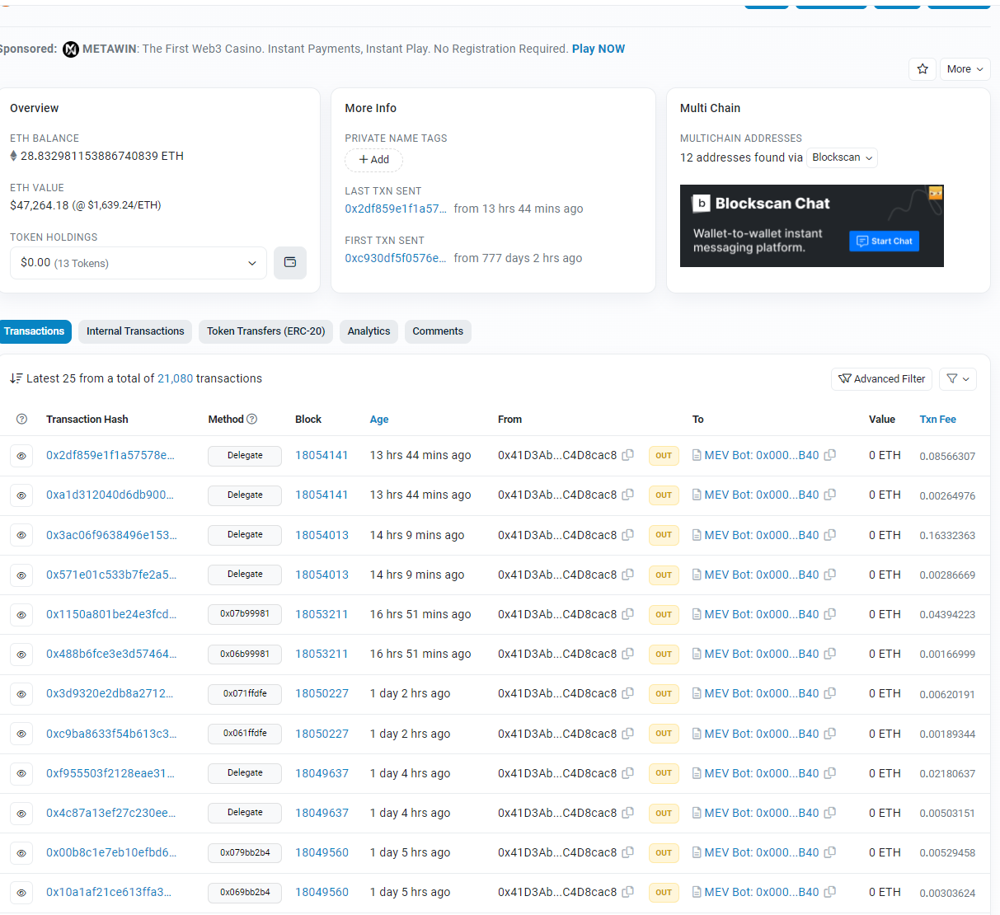

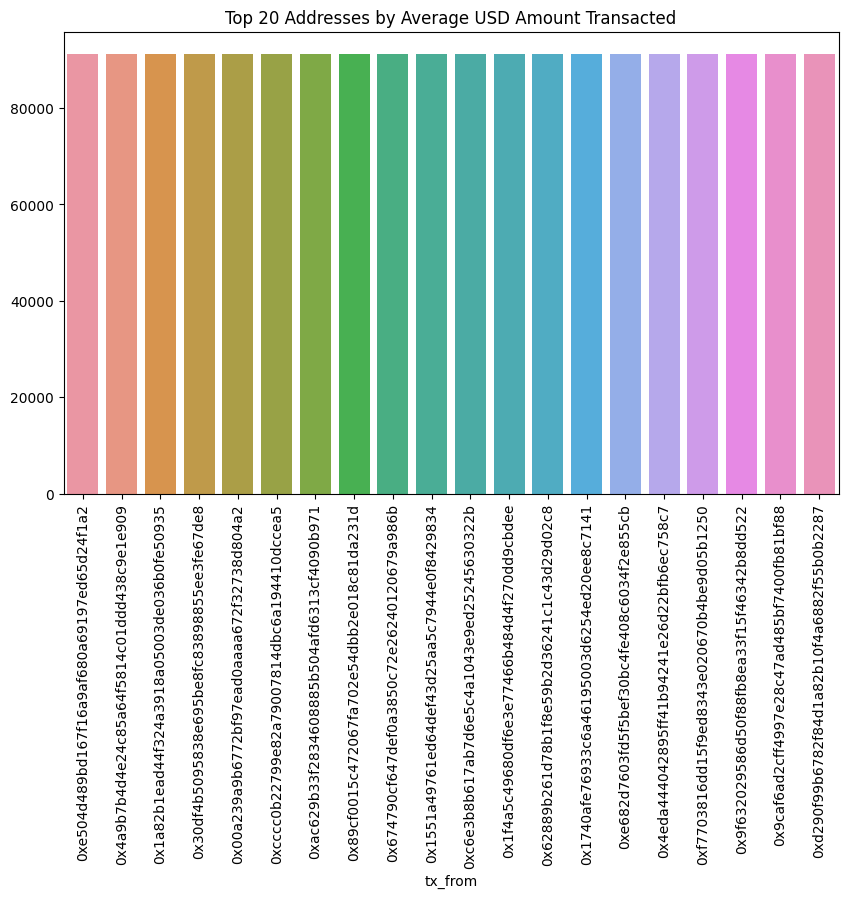

In [ ]:
#Average Volume measured as value per transaction by Address -> I'm interested, which addresses had the highest average value per transaction (total value divided by amount of transactions)

top_avg_addresses = df_no_outliers.groupby('tx_from')['avg_usd_amount_transacted'].max().sort_values(ascending=False).head(20) #after grouping per addresses I decided to get the highest (max) value instead of the mean of the mean -> to be discussed
plt.figure(figsize=(10, 6))
sns.barplot(x=top_avg_addresses.index, y=top_avg_addresses.values)
plt.xticks(rotation=90)
plt.title('Top 20 Addresses by Average USD Amount Transacted')
plt.show()



In [ ]:
top_avg_addresses

tx_from
0xe504d489bd167f16a9af680a69197ed65d24f1a2   91275.42
0x4a9b7b4d4e24c85a64f5814c01ddd438c9e1e909   91265.75
0x1a82b1ead44f324a3918a05003de036b0fe50935   91265.24
0x30df4b5095838e695be8fc83898855ee3fe67de8   91262.92
0x00a239a9b6772bf97ead0aaaa672f32738d804a2   91262.64
0xcccc0b22799e82a79007814dbc6a194410dccea5   91262.18
0xac629b33f2834608885b504afd6313cf4090b971   91258.34
0x89cf0015c472067fa702e54dbb2e018c81da231d   91257.24
0x674790cf647def0a3850c72e26240120679a986b   91255.48
0x1551a49761ed64def43d25aa5c7944e0f8429834   91239.09
0xc6e3b8b617ab7d6e5c4a1043e9ed25245630322b   91237.50
0x1f4a5c49680df6e3e77466b484d4f270dd9cbdee   91235.02
0x62889b261d78b1f8e59b2d36241c1c43d29d02c8   91227.45
0x1740afe76933c6a46195003d6254ed20ee8c7141   91220.84
0xe682d7603fd5f5bef30bc4fe408c6034f2e855cb   91216.64
0x4eda444042895ff41b94241e26d22bfb6ec758c7   91215.70
0xf7703816dd15f9ed8343e020670b4be9d05b1250   91215.57
0x9f632029586d50f88fb8ea33f15f46342b8dd522   91212.27
0x9caf6ad2cff4997e28

In [ ]:
#IMPORTANT: this df is the same as the one we created below as we do not have any address duplicates in just one protocol
df_top_20_avg_addresses = df_no_outliers[df_no_outliers["tx_from"].isin(top_avg_addresses.index.tolist())]
df_top_20_avg_addresses

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
92069,0xac629b33f2834608885b504afd6313cf4090b971,6.00,3,547550.05,91258.34,3,2,182516.68
103385,0x1551a49761ed64def43d25aa5c7944e0f8429834,5.00,1,456195.47,91239.09,2,2,228097.73
140282,0x30df4b5095838e695be8fc83898855ee3fe67de8,3.00,3,273788.77,91262.92,2,1,136894.38
140286,0xcccc0b22799e82a79007814dbc6a194410dccea5,3.00,2,273786.53,91262.18,2,1,136893.26
140307,0x1f4a5c49680df6e3e77466b484d4f270dd9cbdee,3.00,1,273705.06,91235.02,2,1,136852.53
140341,0x9caf6ad2cff4997e28c47ad485bf7400fb81bf88,3.00,3,273615.88,91205.29,1,3,273615.88
175882,0xe504d489bd167f16a9af680a69197ed65d24f1a2,2.00,2,182550.84,91275.42,1,2,182550.84
175902,0x674790cf647def0a3850c72e26240120679a986b,2.00,2,182510.95,91255.48,2,1,91255.48
175924,0x1740afe76933c6a46195003d6254ed20ee8c7141,2.00,2,182441.67,91220.84,1,2,182441.67
175942,0xd290f99b6782f84d1a82b10f4a6882f55b0b2287,2.00,1,182408.87,91204.43,1,2,182408.87


In [ ]:
#IMPORTANT: this df is the same as the one we created above as we do not have any address duplicates in just one protocol
#look up values for the top 20 avg amount groupby in to the df_top_20

type(top_avg_addresses.reset_index())
#reset index so that the series becomes a dataframe!
top_avg_addresses_df = top_avg_addresses.reset_index()

merged_df = pd.merge(top_avg_addresses_df, df_top_20_avg_addresses, how = "inner", left_on = ["tx_from", "avg_usd_amount_transacted"], right_on=['tx_from', 'avg_usd_amount_transacted'])
#merged_df.tx_from.duplicated()

merged_df

,tx_from,avg_usd_amount_transacted,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,0xe504d489bd167f16a9af680a69197ed65d24f1a2,91275.42,2.00,2,182550.84,1,2,182550.84
1,0x4a9b7b4d4e24c85a64f5814c01ddd438c9e1e909,91265.75,1.00,1,91265.75,1,1,91265.75
2,0x1a82b1ead44f324a3918a05003de036b0fe50935,91265.24,1.00,1,91265.24,1,1,91265.24
3,0x30df4b5095838e695be8fc83898855ee3fe67de8,91262.92,3.00,3,273788.77,2,1,136894.38
4,0x00a239a9b6772bf97ead0aaaa672f32738d804a2,91262.64,1.00,1,91262.64,1,1,91262.64
5,0xcccc0b22799e82a79007814dbc6a194410dccea5,91262.18,3.00,2,273786.53,2,1,136893.26
6,0xac629b33f2834608885b504afd6313cf4090b971,91258.34,6.00,3,547550.05,3,2,182516.68
7,0x89cf0015c472067fa702e54dbb2e018c81da231d,91257.24,1.00,1,91257.24,1,1,91257.24
8,0x674790cf647def0a3850c72e26240120679a986b,91255.48,2.00,2,182510.95,2,1,91255.48
9,0x1551a49761ed64def43d25aa5c7944e0f8429834,91239.09,5.00,1,456195.47,2,2,228097.73


In [ ]:
shared_addresses = top_avg_addresses.index.isin(top_addresses.index.tolist())
#np.argindex(shared_addresses == True)
indices = np.where(top_avg_addresses.index.isin(top_addresses.index.tolist()))
indices[0]
shared_addresses

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False])

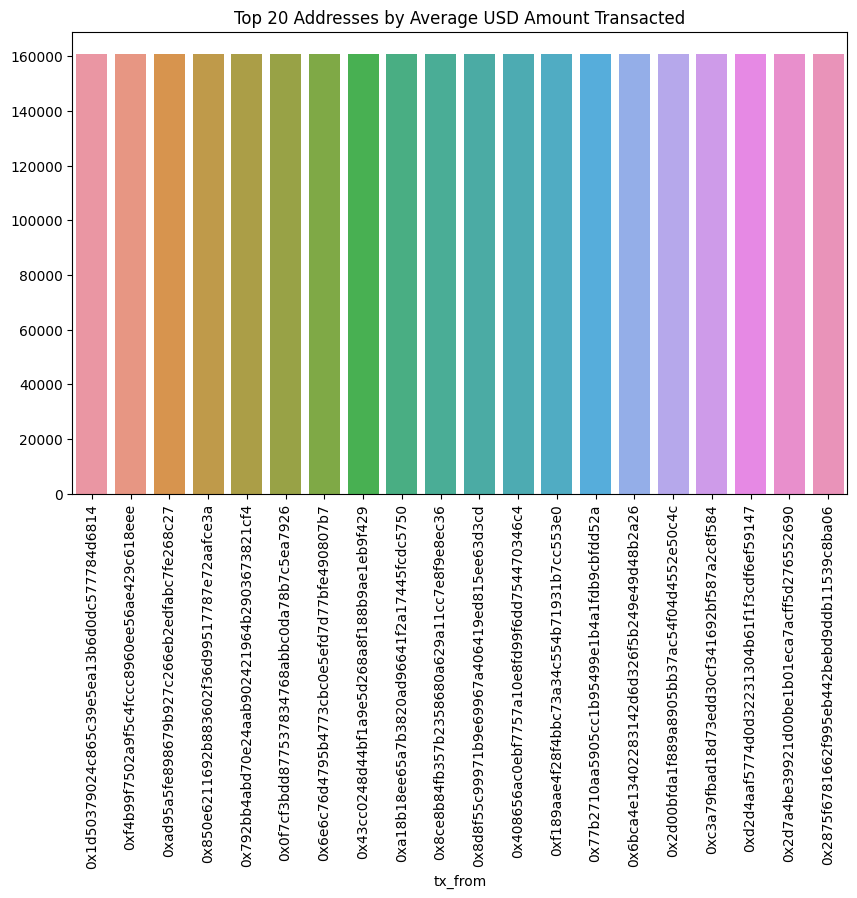

In [ ]:
#Average Volume measured as value per transaction by Address -> I'm interested, which addresses had the highest average value per transaction (total value divided by amount of transactions)

top_avg_addresses = df_no_outliers_log.groupby('tx_from')['avg_usd_amount_transacted'].max().sort_values(ascending=False).head(20) #after grouping per addresses I decided to get the highest (max) value instead of the mean of the mean -> to be discussed
plt.figure(figsize=(10, 6))
sns.barplot(x=top_avg_addresses.index, y=top_avg_addresses.values)
plt.xticks(rotation=90)
plt.title('Top 20 Addresses by Average USD Amount Transacted')
plt.show()

In [ ]:
top_avg_addresses

tx_from
0x1d50379024c865c39e5ea13b6d0dc577784d6814   160974.33
0xf4b99f7502a9f5c4fccc8960ee56ae429c618eee   160965.99
0xad95a5fe898679b927c266eb2edfabc7fe268c27   160942.77
0x850e6211692b883602f36d99517787e72aafce3a   160933.51
0x792bb4abd70e24aab902421964b2903673821cf4   160924.50
0x0f7cf3bdd877537834768abbc0da78b7c5ea7926   160919.56
0x6e6c76d4795b4773cbc0e5efd7d77bfe490807b7   160899.10
0x43cc0248d44bf1a9e5d268a8f188b9ae1eb9f429   160893.22
0xa18b18ee65a7b3820ad96641f2a17445fcdc5750   160889.85
0x8ce8b84fb357b2358680a629a11cc7e8f9e8ec36   160879.64
0x8d8f55c99971b9e69967a406419ed815ee63d3cd   160868.20
0x408656ac0ebf7757a10e8fd99f6dd754470346c4   160862.02
0xf189aae4f28f4bbc73a34c554b71931b7cc553e0   160852.82
0x77b2710aa5905cc1b95499e1b4a1fdb9cbfdd52a   160843.73
0x6bca4e13402283142d6d326f5b249e49d48b2a26   160838.29
0x2d00bfda1f889a8905bb37ac54f04d4552e50c4c   160833.71
0xc3a79fbad18d73edd30cf341692bf587a2c8f584   160829.22
0xd2d4aaf5774d0d32231304b61f1f3cdf6ef59147   160828.69
0x

In [ ]:
#IMPORTANT: this df is the same as the one we created below as we do not have any address duplicates in just one protocol
df_top_20_avg_addresses = df_no_outliers_log[df_no_outliers_log["tx_from"].isin(top_avg_addresses.index.tolist())]
df_top_20_avg_addresses

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
56065,0x2875f6781662f995eb442bebd9ddb11539c8ba06,7.00,3,1125706.15,160815.16,1,7,1125706.15
62830,0xf4b99f7502a9f5c4fccc8960ee56ae429c618eee,6.00,1,965795.93,160965.99,2,3,482897.97
62861,0x408656ac0ebf7757a10e8fd99f6dd754470346c4,6.00,2,965172.13,160862.02,2,3,482586.07
71241,0xa18b18ee65a7b3820ad96641f2a17445fcdc5750,5.00,4,804449.23,160889.85,3,1,268149.74
99886,0x43cc0248d44bf1a9e5d268a8f188b9ae1eb9f429,3.00,2,482679.65,160893.22,2,1,241339.82
99907,0x6bca4e13402283142d6d326f5b249e49d48b2a26,3.00,2,482514.88,160838.29,3,1,160838.29
99913,0xc3a79fbad18d73edd30cf341692bf587a2c8f584,3.00,3,482487.65,160829.22,1,3,482487.65
127654,0x1d50379024c865c39e5ea13b6d0dc577784d6814,2.00,2,321948.65,160974.33,1,2,321948.65
127688,0x8ce8b84fb357b2358680a629a11cc7e8f9e8ec36,2.00,2,321759.29,160879.64,1,2,321759.29
127693,0x8d8f55c99971b9e69967a406419ed815ee63d3cd,2.00,2,321736.40,160868.20,1,2,321736.40


In [ ]:
#IMPORTANT: this df is the same as the one we created above as we do not have any address duplicates in just one protocol
#look up values for the top 20 avg amount groupby in to the df_top_20

type(top_avg_addresses.reset_index())
#reset index so that the series becomes a dataframe!
top_avg_addresses_df = top_avg_addresses.reset_index()

merged_df = pd.merge(top_avg_addresses_df, df_top_20_avg_addresses, how = "inner", left_on = ["tx_from", "avg_usd_amount_transacted"], right_on=['tx_from', 'avg_usd_amount_transacted'])
#merged_df.tx_from.duplicated()

merged_df

,tx_from,avg_usd_amount_transacted,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,0x1d50379024c865c39e5ea13b6d0dc577784d6814,160974.33,2.00,2,321948.65,1,2,321948.65
1,0xf4b99f7502a9f5c4fccc8960ee56ae429c618eee,160965.99,6.00,1,965795.93,2,3,482897.97
2,0xad95a5fe898679b927c266eb2edfabc7fe268c27,160942.77,1.00,1,160942.77,1,1,160942.77
3,0x850e6211692b883602f36d99517787e72aafce3a,160933.51,1.00,1,160933.51,1,1,160933.51
4,0x792bb4abd70e24aab902421964b2903673821cf4,160924.50,1.00,1,160924.50,1,1,160924.50
5,0x0f7cf3bdd877537834768abbc0da78b7c5ea7926,160919.56,1.00,1,160919.56,1,1,160919.56
6,0x6e6c76d4795b4773cbc0e5efd7d77bfe490807b7,160899.10,1.00,1,160899.10,1,1,160899.10
7,0x43cc0248d44bf1a9e5d268a8f188b9ae1eb9f429,160893.22,3.00,2,482679.65,2,1,241339.82
8,0xa18b18ee65a7b3820ad96641f2a17445fcdc5750,160889.85,5.00,4,804449.23,3,1,268149.74
9,0x8ce8b84fb357b2358680a629a11cc7e8f9e8ec36,160879.64,2.00,2,321759.29,1,2,321759.29


In [ ]:
shared_addresses = top_avg_addresses.index.isin(top_addresses.index.tolist())
#np.argindex(shared_addresses == True)
indices = np.where(top_avg_addresses.index.isin(top_addresses.index.tolist()))
indices[0]
shared_addresses

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False])

**Insights highest amount per transaction (avg amount)**

* no common addresses shared between the addresses with the highest total values and the highest avg values -> could indicate a cluster/pattern!
* randomly checking on etherscan, these transactions were valid ones, yet unlabeled -> could indicate a trader pattern/cluster




###Relationships between the features:
* between numerical -> scatter plots or pair plots
* between selected categorical and numerical -> violin plots - > **will be done in a later analysis (different notebook) when I segment my data based on quantiles**

####pairplots

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


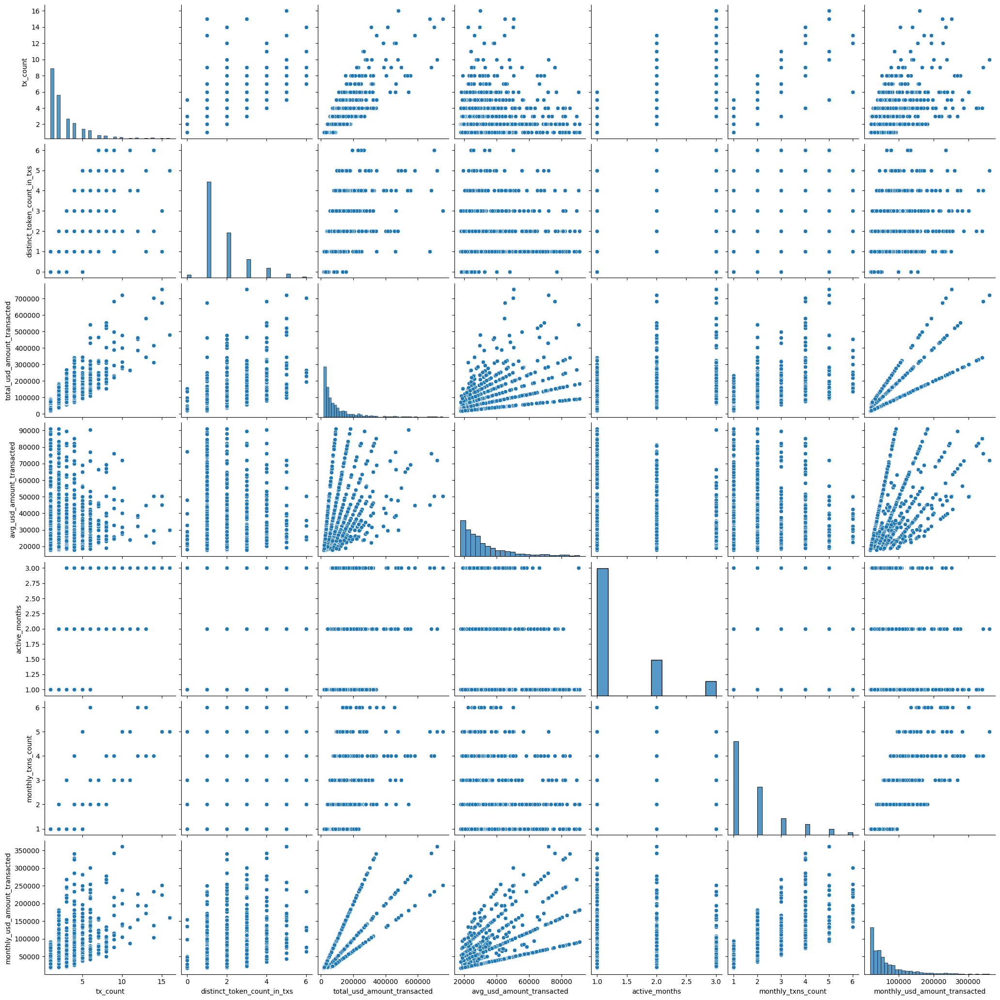

In [ ]:
sns.pairplot(sample_num_no_outliers, size=3)

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


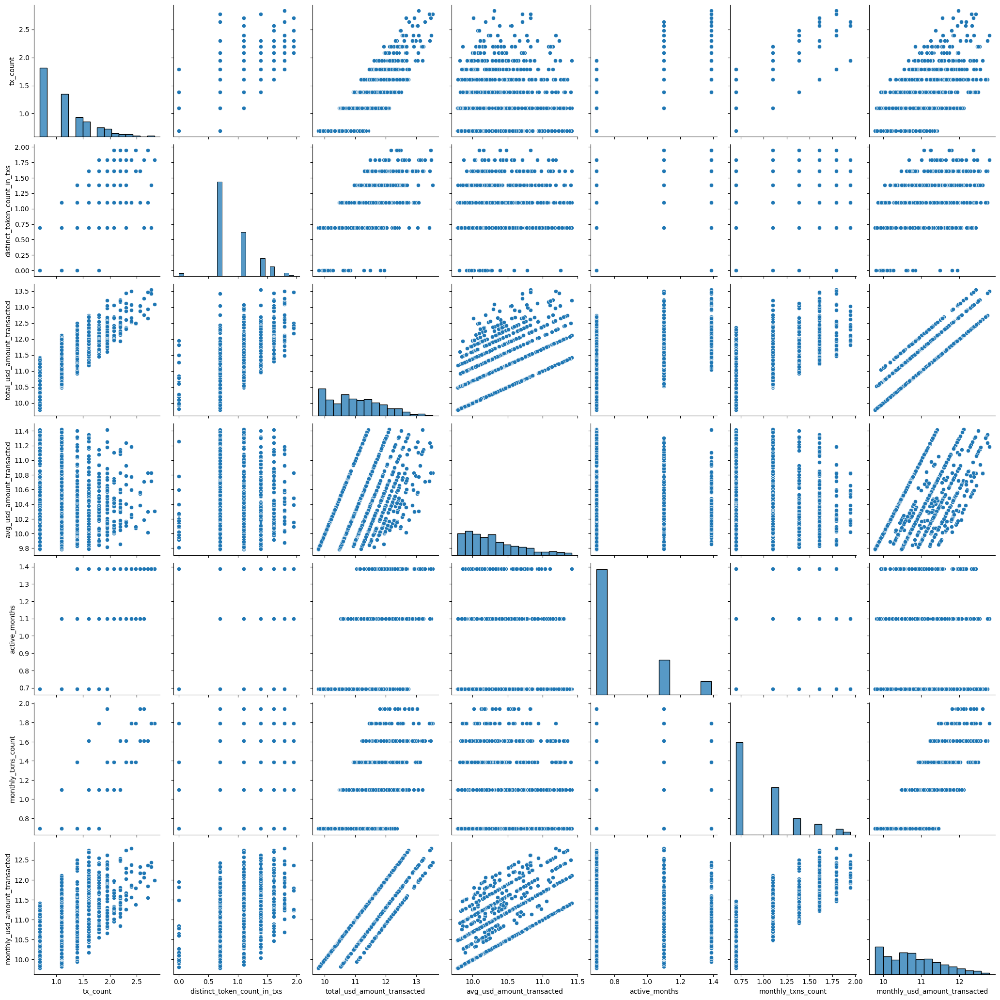

In [ ]:
sns.pairplot(sample_num_no_outliers.apply(lambda x: np.log(x+ 1)), size=3)

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


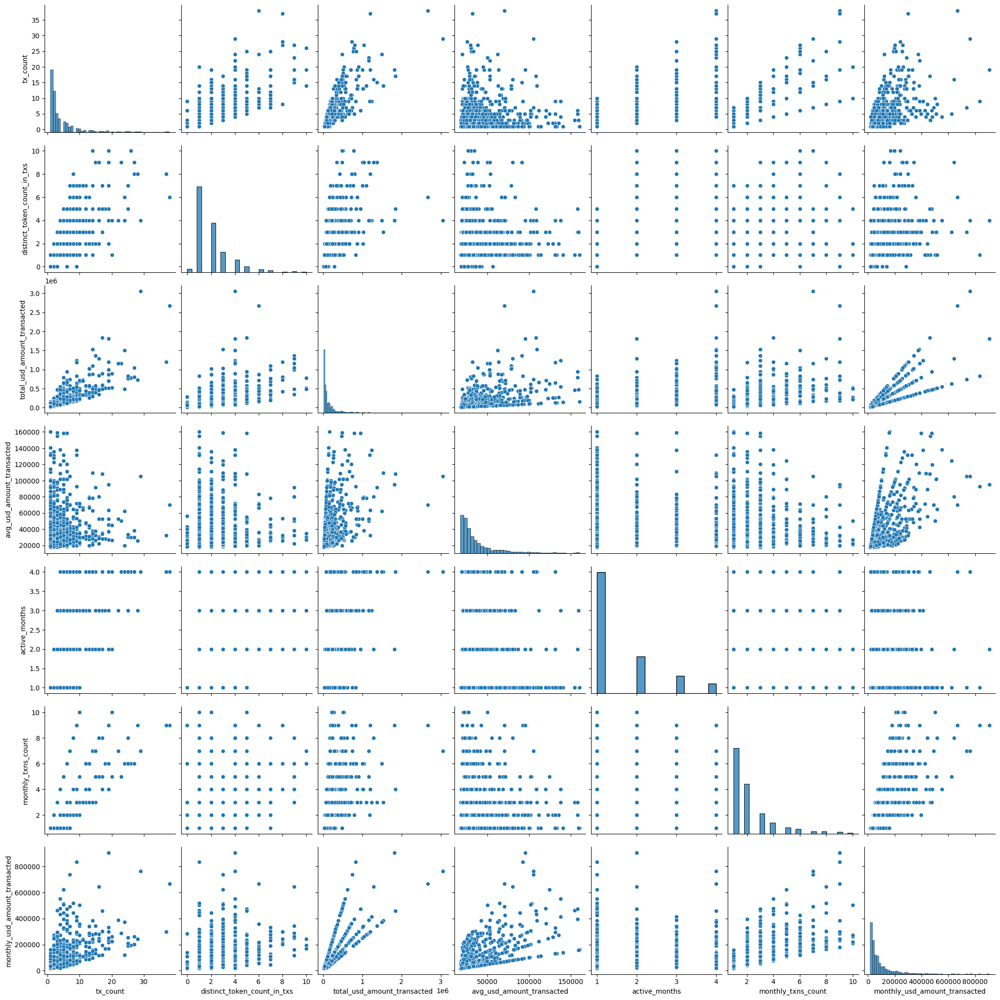

In [ ]:
sns.pairplot(sample_no_outlier_log_num, size=3)

###Correlation (linear relationship between variables)

<ipython-input-80-077d823ba224>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_no_outliers.corr()


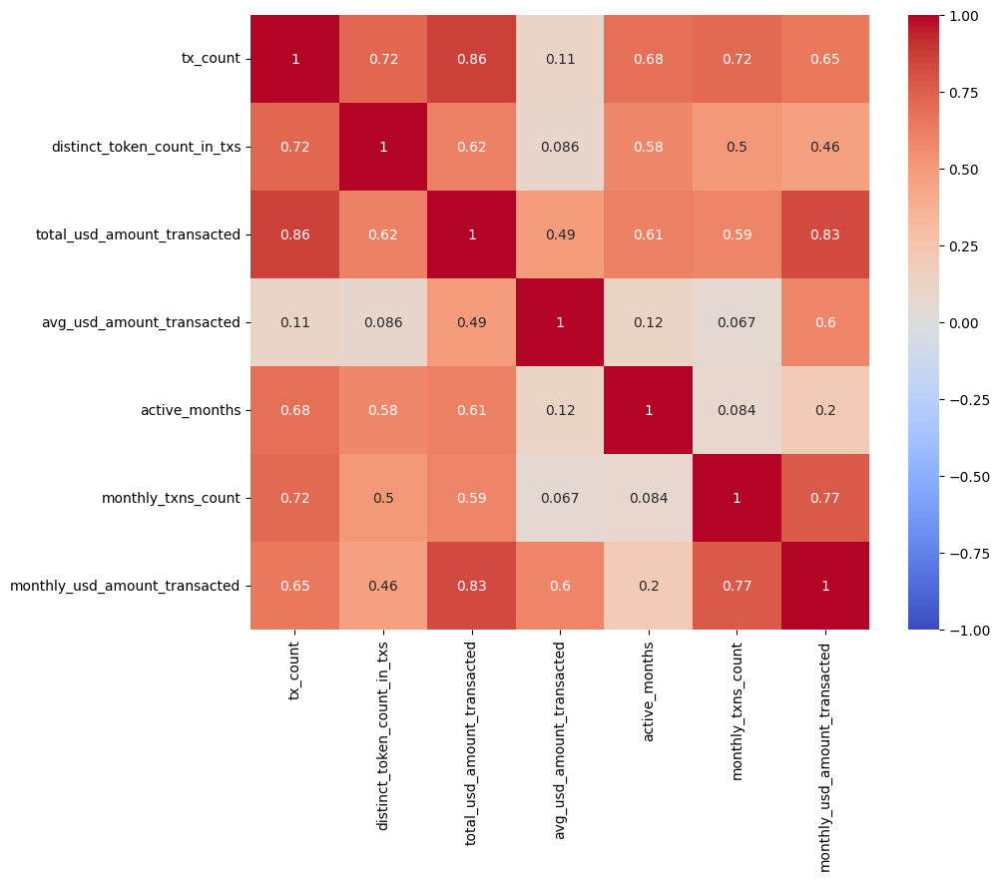

In [ ]:
#heatmaps
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = df_no_outliers.corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.show()


<ipython-input-81-35cf059ef797>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_no_outliers_log.corr()


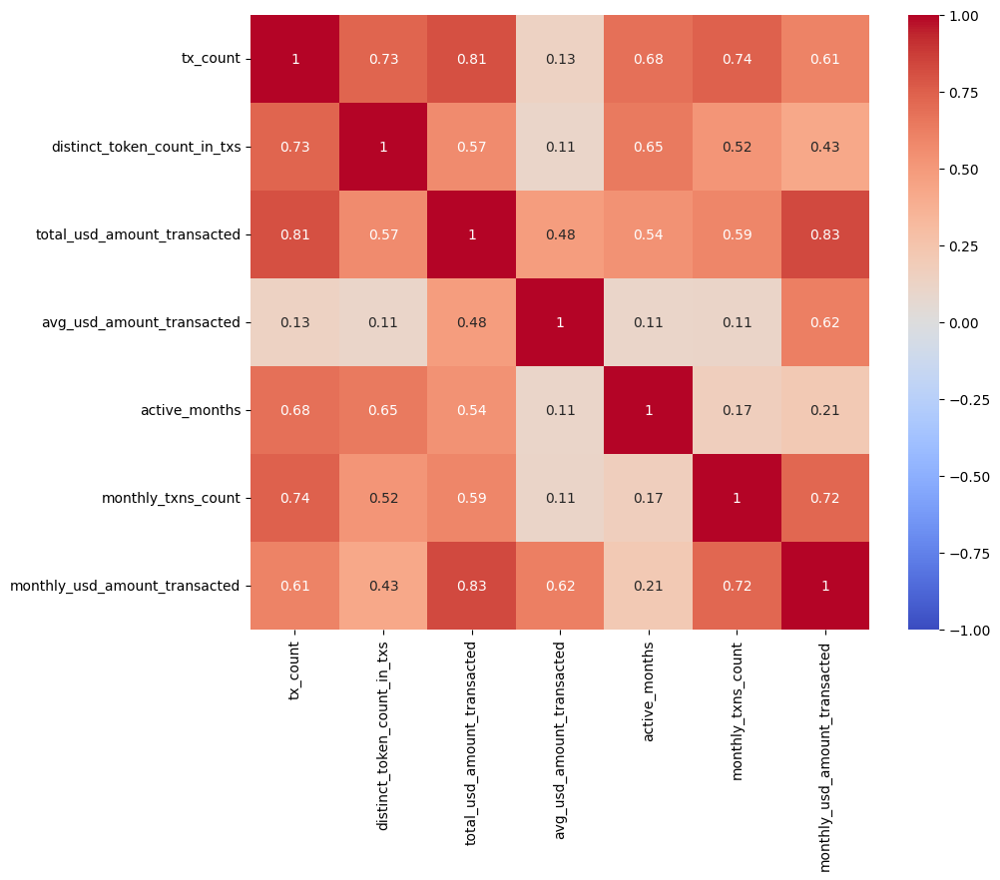

In [ ]:
#heatmaps
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = df_no_outliers_log.corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.show()

Insights on linear relationship:
* As expected we have high correlation between features and their monthly breakdowns such as (tx_count, monthly_txns_count), (total_usd_amount, monthly usd_amount)
* low correlation between average usd amount and the other features which shows that we should use this in our analysis.
* also interesting that we have a quite linear relationship between total usd amount and tx count suggesting that the higher the toal usd amount the more transaction is executed. this does not to be straightforward as there are different trader types that could act differently. it suggests that most traders fall into a type that transacts a lot and with each transaction we do not have very high transactions values


### **Insights from EDA**
There are several paths to pursue from here:

* Baseline model: Build a basic clustering model (k-means) and visualizations (t-sne, Umap). My hypothesis is that it does not yield much insights besides the noise we encounter when including different protocols. I expect sightly less noise though.This baseline model contains outliers as defined above.

* Rerun the models on the log data, as it could help the linear clusterin algorithms and pca to better seperate data

* Create a new notebook and focus on the outliers, some might be outliers, others I would like to include. Re run modelling.

* Create a new notebook (first with outliers, then without outliers) that segments the dataframe based on quantiles. Include the eda with pairplots segmented on different combinations of average transaction value and total transaction value. Also, bear in mind if you would discard the 25th quantile of the whole data set, if there is too much noise for very low traders to get some insights.  

**always keep track on insights, the goal ultimately is to create a story on our presentation, not to find the perfect method to go through the case - that would be analysis paralysis! if you are up to something, dwelve into it!"**

##Save to CSV to speed up the loading process for the modelling part later

In [ ]:
df.head()

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65


In [ ]:
df.shape

(396580, 8)

In [ ]:
df_uniswap_baseline = df

In [ ]:
df_uniswap_baseline.to_csv('/content/drive/My Drive/df_uniswap_baseline.csv')

##To Do before Modelling to speed up the data loading process -> in case modelling breaks down to computational problems


reload the next cell for modelling purposes

In [ ]:
import pandas as pd
pd.set_option('display.float_format', '{:.2f}'.format) #get non scientic notation

df_uniswap_baseline = pd.read_csv('/content/drive/My Drive/df_uniswap_baseline.csv')
df_uniswap_baseline.drop(['Unnamed: 0'],axis=1,inplace=True)
df_uniswap_baseline.head()

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65


In [ ]:

# Exclude the 'tx_from' column for clustering
X = df_uniswap_baseline.drop('tx_from', axis=1)
X.head()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97
1,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44
2,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68
3,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12
4,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65


In [ ]:
X.shape

#Modelling on original whole data set

In [ ]:
X_log = df_no_outliers_log.drop("tx_from", axis =1)

##K-Means

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

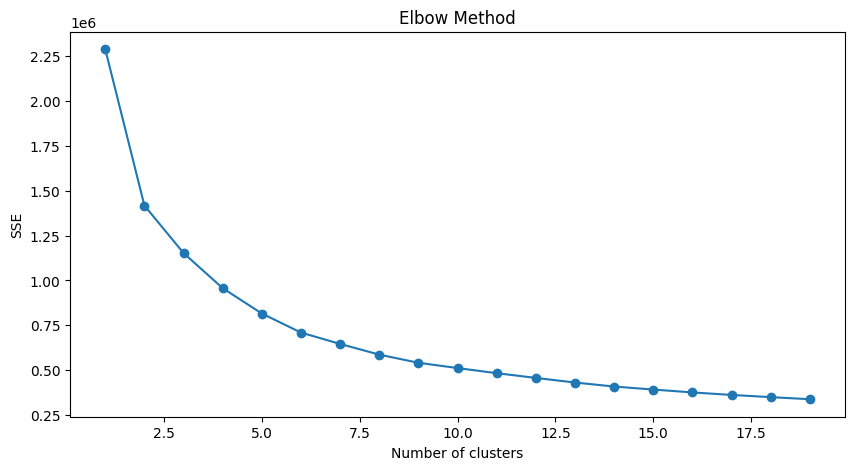

In [ ]:
r_seed = 24 # random seed to use during modeling for reproducability purposes


# List to hold the SSE for each number of clusters
sse = []
# List to hold the silhouette score for each number of clusters
silhouette = []

# Iterate over possible number of clusters
for k in range(1, 20):
    # Set the number of clusters
    n_clusters = k
    kmeans_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters = n_clusters, random_state = r_seed, verbose=0))])
    # Fit the data
    kmeans_pipeline.fit(X_log)
    cluster_labels = kmeans_pipeline.predict(X_log)
    # Append the SSE for k clusters to sse list
    sse.append(kmeans_pipeline.named_steps["cluster"].inertia_)
    # Append the silhouette score for k clusters to silhouette list
    #silhouette.append(silhouette_score(X, cluster_labels)) #ignore silhouette score for now as its too computationally expensive for the large data set

# Plot the SSE for each number of clusters
plt.figure(figsize=(10, 5))
plt.plot(range(1, 20), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.title('Elbow Method')
plt.show()

# Plot the silhouette score for each number of clusters
#plt.figure(figsize=(10, 5))
#plt.plot(range(1, 15), silhouette, marker='o')
#plt.xlabel('Number of clusters')
#plt.ylabel('Silhouette Score')
#plt.title('Silhouette Method')
#plt.show()

In [ ]:
#cluster my data
kmeans_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters = 5, random_state = 42, verbose=0))]) # change this first
# Fit the data
kmeans_pipeline.fit(X_log)
cluster_labels = kmeans_pipeline.predict(X_log)

df_no_outliers_log["cluster_labels"] = cluster_labels
df_no_outliers_log_sorted_desc = df_no_outliers_log.sort_values(by="total_usd_amount_transacted", ascending = False)
df_no_outliers_log_sorted_desc.head()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
14183,0xf0101fa2e78a81f35a884ac6524efa9ee71f8db8,42.00,3,6719291.07,159983.12,4,10,1679822.77,4
14394,0x566d641969bd80572c4c970b427fc10ada4f315e,43.00,7,6604208.79,153586.25,4,10,1651052.20,4
14553,0x1a258c5032159d1a0dd1d68e80e02bc5edfd5231,41.00,8,6512170.39,158833.42,4,10,1628042.60,4
15021,0xa1bed88e5333bbf6e9617974d9e8286e56b88f68,41.00,9,6257546.42,152623.08,4,10,1564386.60,4
15862,0x78d3b7481ca0296fc474c0447ba986cd1895dcfc,37.00,7,5836643.58,157747.12,4,9,1459160.90,4


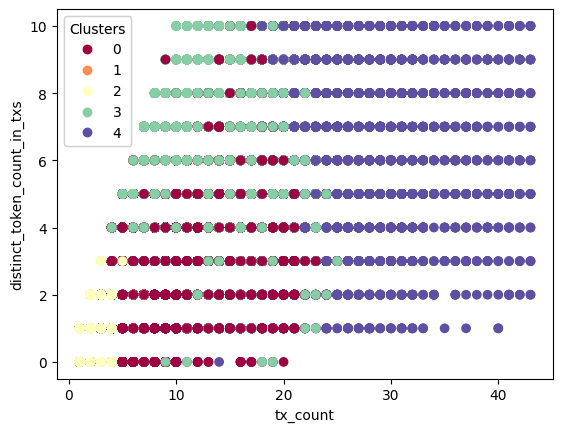

In [ ]:
# Create the scatter plot
scatter = plt.scatter(
    df_no_outliers_log_sorted_desc.iloc[:, 1],
    df_no_outliers_log_sorted_desc.iloc[:, 2],
    c=df_no_outliers_log_sorted_desc['cluster_labels'],
    cmap=plt.cm.Spectral
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot
plt.xlabel(df_no_outliers_log_sorted_desc.iloc[:, 1].name)
plt.ylabel(df_no_outliers_log_sorted_desc.iloc[:, 2].name)
plt.show()


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


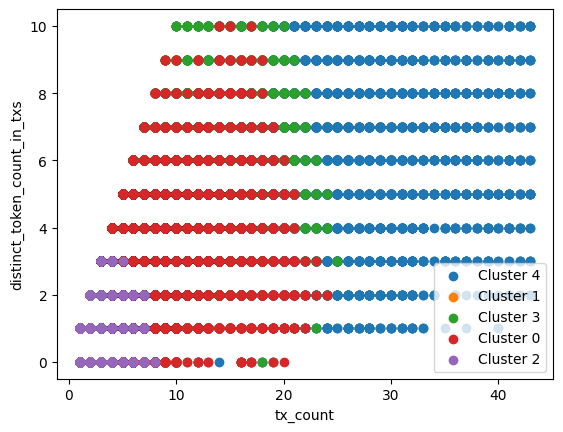

In [ ]:
unique_labels = df_no_outliers_log_sorted_desc['cluster_labels'].unique()

# Plot each cluster with a unique color and label
for label in unique_labels:
    # Filter data for the current cluster label
    cluster_data = df_no_outliers_log_sorted_desc[df_no_outliers_log_sorted_desc['cluster_labels'] == label]

    # Plot the data for the current cluster
    plt.scatter(cluster_data.iloc[:, 1], cluster_data.iloc[:, 2], label=f'Cluster {label}')

# Display the legend
plt.legend()
plt.xlabel(f"{cluster_data.iloc[:, 1].name}")
plt.ylabel(f"{cluster_data.iloc[:, 2].name}")
# Show the plot
plt.show()

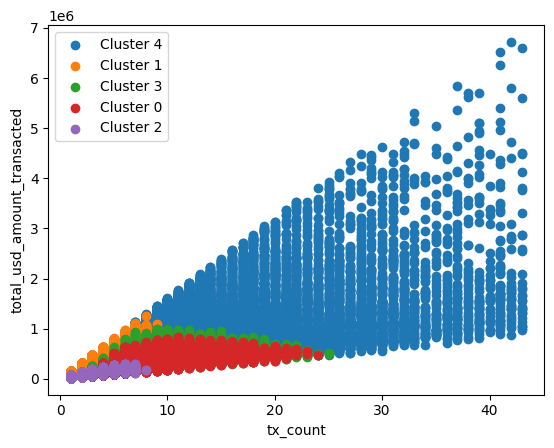

In [ ]:
unique_labels = df_no_outliers_log_sorted_desc['cluster_labels'].unique()

# Plot each cluster with a unique color and label
for label in unique_labels:
    # Filter data for the current cluster label
    cluster_data = df_no_outliers_log_sorted_desc[df_no_outliers_log_sorted_desc['cluster_labels'] == label]

    # Plot the data for the current cluster
    plt.scatter(cluster_data.iloc[:, 1], cluster_data.iloc[:, 3], label=f'Cluster {label}')

# Display the legend
plt.legend()
plt.xlabel(f"{cluster_data.iloc[:, 1].name}")
plt.ylabel(f"{cluster_data.iloc[:, 3].name}")
# Show the plot
plt.show()

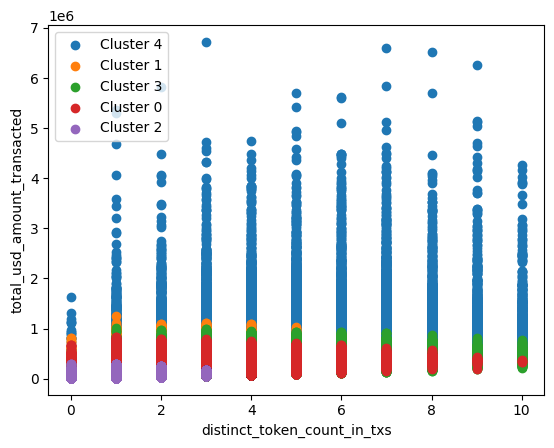

In [ ]:
unique_labels = df_no_outliers_log_sorted_desc['cluster_labels'].unique()

# Plot each cluster with a unique color and label
for label in unique_labels:
    # Filter data for the current cluster label
    cluster_data = df_no_outliers_log_sorted_desc[df_no_outliers_log_sorted_desc['cluster_labels'] == label]

    # Plot the data for the current cluster
    plt.scatter(cluster_data.iloc[:, 2], cluster_data.iloc[:, 3], label=f'Cluster {label}')

# Display the legend
plt.legend()
plt.xlabel(f"{cluster_data.iloc[:, 2].name}")
plt.ylabel(f"{cluster_data.iloc[:, 3].name}")
# Show the plot
plt.show()

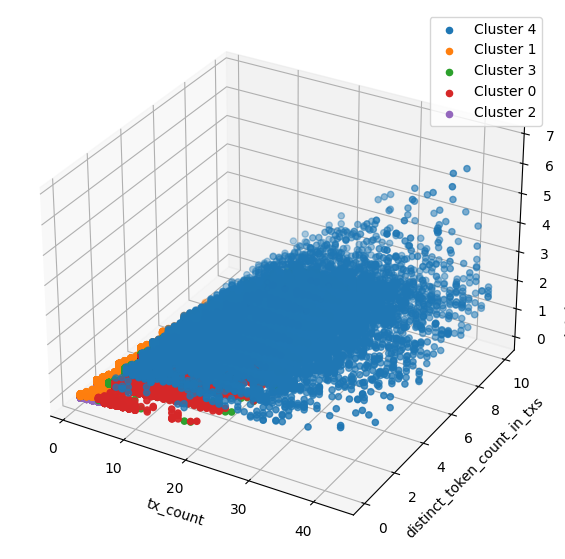

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Create a new figure
fig = plt.figure(figsize=(10, 7))

# Add 3D subplot -> create an axis object that maps the plot-> more powerful
ax = fig.add_subplot(111, projection='3d')

for label in unique_labels:
  cluster_data = df_no_outliers_log_sorted_desc[df_no_outliers_log_sorted_desc["cluster_labels"] == label]
  ax.scatter(cluster_data.iloc[:, 1], cluster_data.iloc[:, 2],cluster_data.iloc[:, 3] , label=f'Cluster {label}')

ax.legend()
ax.set_xlabel(f"{cluster_data.iloc[:, 1].name}")
ax.set_ylabel(f"{cluster_data.iloc[:, 2].name}")
ax.set_zlabel(f"{cluster_data.iloc[:, 3].name}")

plt.show()


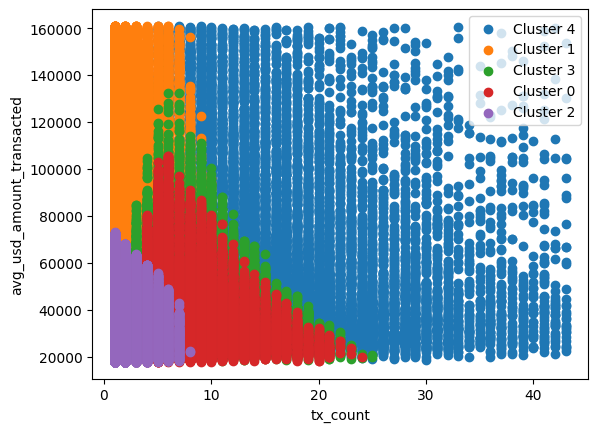

In [ ]:
unique_labels = df_no_outliers_log_sorted_desc['cluster_labels'].unique()

# Plot each cluster with a unique color and label
for label in unique_labels:
    # Filter data for the current cluster label
    cluster_data = df_no_outliers_log_sorted_desc[df_no_outliers_log_sorted_desc['cluster_labels'] == label]

    # Plot the data for the current cluster
    plt.scatter(cluster_data.iloc[:, 1], cluster_data.iloc[:, 4], label=f'Cluster {label}')

# Display the legend
plt.legend()
plt.xlabel(f"{cluster_data.iloc[:, 1].name}")
plt.ylabel(f"{cluster_data.iloc[:, 4].name}")
# Show the plot
plt.show()

##big insights on log

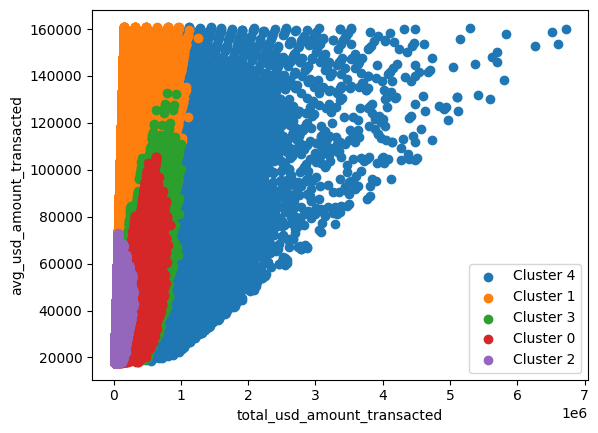

In [ ]:
unique_labels = df_no_outliers_log_sorted_desc['cluster_labels'].unique()

# Plot each cluster with a unique color and label
for label in unique_labels:
    # Filter data for the current cluster label
    cluster_data = df_no_outliers_log_sorted_desc[df_no_outliers_log_sorted_desc['cluster_labels'] == label]

    # Plot the data for the current cluster
    plt.scatter(cluster_data.iloc[:, 3], cluster_data.iloc[:, 4], label=f'Cluster {label}')

# Display the legend
plt.legend()
plt.xlabel(f"{cluster_data.iloc[:, 3].name}")
plt.ylabel(f"{cluster_data.iloc[:, 4].name}")
# Show the plot
plt.show()

In [ ]:
df_no_outliers_log_sorted_desc.groupby('cluster_labels').mean().sort_values(by="total_usd_amount_transacted", ascending = False)


<ipython-input-93-8e3399e8720c>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_no_outliers_log_sorted_desc.groupby('cluster_labels').mean().sort_values(by="total_usd_amount_transacted", ascending = False)


,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
cluster_labels,,,,,,,
4,18.52,5.28,1163573.54,71234.27,2.88,6.38,447852.50
3,7.47,3.87,268870.58,36284.55,2.93,2.28,92433.09
0,7.20,2.77,255872.50,36324.16,1.27,5.62,202675.63
1,2.46,1.64,240828.13,98288.43,1.32,1.81,182625.84
2,1.75,1.34,51153.58,29250.86,1.16,1.47,43683.22


In [ ]:
df_baseline = numerical_df
df_baseline.describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
count,396580.00,396580.00,396580.00,396580.00,396580.00,396580.00,396580.00
mean,44.45,3.55,5999736.11,67489.32,2.15,6.41,720827.66
std,2120.42,10.75,634215318.11,545518.82,2.35,155.75,45375345.74
min,1.00,0.00,17726.54,17726.54,1.00,1.00,17726.54
25%,1.00,1.00,39590.95,23318.76,1.00,1.00,34912.74
50%,2.00,2.00,98140.21,31502.94,1.00,2.00,67079.34
75%,7.00,3.00,342461.15,50504.77,2.00,3.00,165400.22
max,585248.00,1114.00,333885754023.44,172967261.45,32.00,34426.00,19640338471.97


In [ ]:
df_no_outliers.describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
count,278992.00,278992.00,278992.00,278992.00,278992.00,278992.00,278992.00
mean,2.69,1.72,92038.50,32662.11,1.36,1.82,63203.65
std,2.35,1.08,100038.61,15218.22,0.62,1.15,52285.48
min,1.00,0.00,17726.54,17726.54,1.00,1.00,17726.54
25%,1.00,1.00,28821.27,21563.13,1.00,1.00,26613.41
50%,2.00,1.00,54941.41,27290.41,1.00,1.00,45158.10
75%,3.00,2.00,113126.20,38579.75,2.00,2.00,79344.40
max,16.00,6.00,796361.38,91275.42,3.00,6.00,361088.22


In [ ]:
df_no_outliers_log_sorted_desc.describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
count,326880.00,326880.00,326880.00,326880.00,326880.00,326880.00,326880.00,326880.00
mean,3.73,2.00,157488.38,38264.21,1.50,2.16,91257.28,1.96
std,4.41,1.51,265927.25,25192.03,0.83,1.73,113094.44,0.85
min,1.00,0.00,17726.54,17726.54,1.00,1.00,17726.54,0.00
25%,1.00,1.00,33894.46,22254.52,1.00,1.00,29665.71,2.00
50%,2.00,1.00,69092.92,29033.12,1.00,2.00,52575.05,2.00
75%,4.00,2.00,165678.99,43419.05,2.00,2.00,104429.42,2.00
max,43.00,10.00,6719291.07,160974.33,4.00,10.00,1679822.77,4.00


In [ ]:
df_no_outliers_log_sorted_desc[df_no_outliers_log_sorted_desc["cluster_labels"] == 2].describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
count,211669.00,211669.00,211669.00,211669.00,211669.00,211669.00,211669.00,211669.00
mean,1.75,1.34,51153.58,29250.86,1.16,1.47,43683.22,2.00
std,0.96,0.62,34225.62,11206.04,0.38,0.70,25310.23,0.00
min,1.00,0.00,17726.54,17726.54,1.00,1.00,17726.54,2.00
25%,1.00,1.00,24257.25,20698.18,1.00,1.00,23454.30,2.00
50%,1.00,1.00,41052.65,25289.93,1.00,1.00,37554.29,2.00
75%,2.00,2.00,65915.31,34208.39,1.00,2.00,55199.40,2.00
max,8.00,3.00,299396.01,72904.72,3.00,4.00,173064.40,2.00


In [ ]:
df_no_outliers_log_sorted_desc.groupby('cluster_labels').size().sort_values( ascending = False)

cluster_labels
2    211669
3     46971
0     28533
1     27613
4     12094
dtype: int64

In [ ]:
df_no_outliers_log_sorted_desc[df_no_outliers_log_sorted_desc["cluster_labels"] == 4].describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
count,12094.00,12094.00,12094.00,12094.00,12094.00,12094.00,12094.00,12094.00
mean,18.52,5.28,1163573.54,71234.27,2.88,6.38,447852.50,4.00
std,7.67,2.26,620563.20,36920.25,0.95,2.12,250915.36,0.00
min,5.00,0.00,338598.27,18670.37,1.00,1.00,116582.51,4.00
25%,13.00,4.00,776258.86,39888.36,2.00,5.00,267828.17,4.00
50%,18.00,5.00,983668.17,62184.12,3.00,6.00,367897.89,4.00
75%,23.00,7.00,1335064.73,97141.78,4.00,8.00,555950.22,4.00
max,43.00,10.00,6719291.07,160815.16,4.00,10.00,1679822.77,4.00


In [ ]:
df_no_outliers_log_sorted_desc[df_no_outliers_log_sorted_desc["cluster_labels"] == 1].describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
count,27613.00,27613.00,27613.00,27613.00,27613.00,27613.00,27613.00,27613.00
mean,2.46,1.64,240828.13,98288.43,1.32,1.81,182625.84,1.00
std,1.56,0.86,172273.17,25526.70,0.57,0.95,107207.87,0.00
min,1.00,0.00,71846.82,54038.94,1.00,1.00,67196.07,1.00
25%,1.00,1.00,118432.73,77549.60,1.00,1.00,102874.02,1.00
50%,2.00,1.00,185908.03,94023.03,1.00,2.00,149871.63,1.00
75%,3.00,2.00,302857.29,114811.53,2.00,2.00,224623.00,1.00
max,10.00,6.00,1248927.91,160974.33,4.00,6.00,803854.89,1.00


**Insights**

* I stand by my insights from the non log non outlier one.
* It gets harder to seperate the clusters when logged though.
* in line with more dbscan clusters (double)

##PCA & K-means


###Clustering on Original Data, then Visualizing with UNSCALED PCA (code 1):



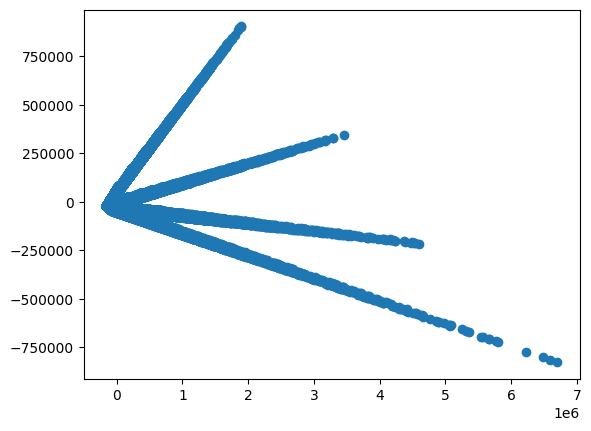

In [ ]:
#we do pca with 2 principal components first for visualization
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from matplotlib import pyplot as plt
#without standard sclaer I get a different image
X_pca_unscaled = PCA(n_components =2).fit_transform(X_log)
plt.scatter(X_pca_unscaled[:,0], X_pca_unscaled[:,1])


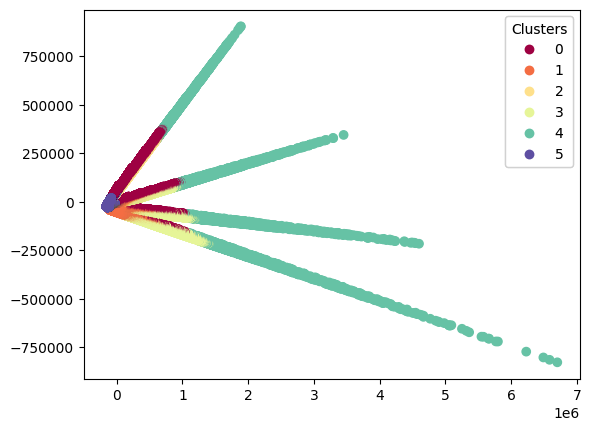

In [ ]:
#color code the initial clusters above to check if result is same as below
# Create the scatter plot
scatter = plt.scatter(
    X_pca_unscaled[:,0],
    X_pca_unscaled[:,1],
    c=df_no_outliers_log_sorted_desc['cluster_labels'],
    cmap=plt.cm.Spectral
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot

plt.show()

This method gives you a visualization of high-dimensional clusters in a PCA space derived from the unscaled data.

If this visualization looks similar to when you simply use the first two columns of the dataset, it suggests that the majority of the variance in your data might be captured by these two columns. In other words, these two features heavily influence the PCA transformation when the data isn't scaled.

###Clustering on Original Data, then Visualizing with SCALED PCA (code 1):

primarily interested in clustering the data based on its original features (in the high-dimensional space) but want a 2D visualization to understand the cluster separations and distributions.


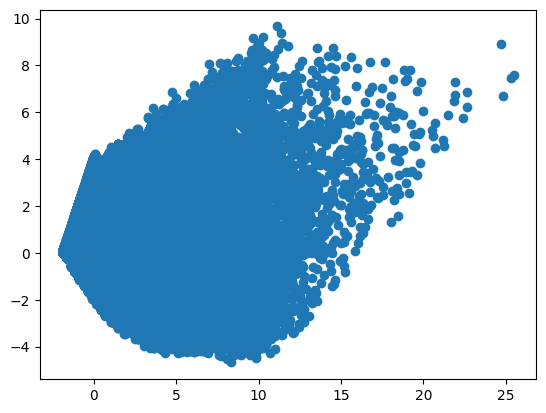

In [ ]:
pipeline_pca = Pipeline([("scaler", StandardScaler()),("pca", PCA(n_components = 2))])

X_pca_scaled = pipeline_pca.fit_transform(X_log)

plt.scatter(X_pca_scaled[:,0],X_pca_scaled[:,1])

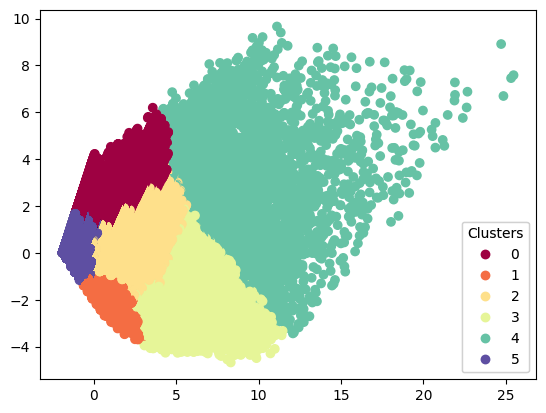

In [ ]:
#color code the initial clusters above to check if result is same as below
# Create the scatter plot
scatter = plt.scatter(
    X_pca_scaled[:,0],
    X_pca_scaled[:,1],
    c=df_no_outliers_log_sorted_desc['cluster_labels'],
    cmap=plt.cm.Spectral
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot

plt.show()



Advantages: The clustering captures the nuances of the high-dimensional data.

Disadvantages: The 2D PCA representation might not always reflect the true separations of the clusters formed in the high-dimensional space. Clusters that look overlapped or mixed in the PCA plot might be well-separated in the original space.

The blurred visualization indicates that clusters formed in the high-dimensional space might not be well-separated in the 2D PCA space. This can happen when clusters are defined by nuances in the high-dimensional space that the 2D PCA representation can't capture.

###Clustering on PCA-Transformed Data (code 2):

When computational efficiency is a concern or when you believe the main variance (captured by the first few principal components) is sufficient to define the clusters. It's also useful when you want the 2D visualization to closely match the clustering results.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


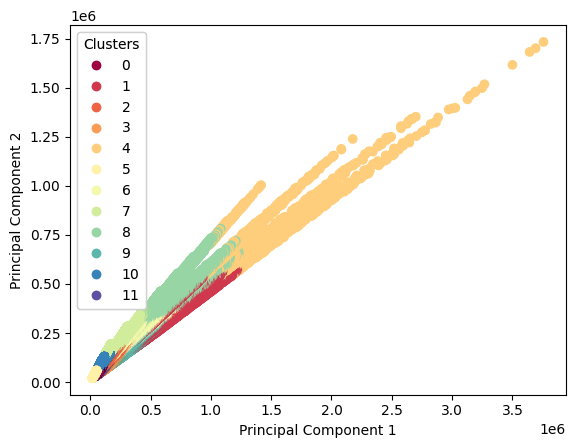

In [ ]:
#Lets redo K-means for the whole dataset!
pipeline_pca_kmeans  = Pipeline([
    ("scaler", StandardScaler()),
    ("pca", PCA(n_components =2)),
     ("cluster", KMeans(n_clusters=12))])

#the fit method for KMeans during the pipeline process automatically assigns cluster labels to the samples,
#which is why we can directly access the labels_ attribute without explicitly calling predict.

pipeline_pca_kmeans.fit(X_log)
X_pca = pipeline_pca_kmeans.named_steps["pca"].transform(X_log)  # Get the PCA-transformed data
cluster_labels = pipeline_pca_kmeans.named_steps["cluster"].labels_  # Get the cluster labels


scatter = plt.scatter(
    X_pca[:,0],
    X_pca[:,1],
    c=cluster_labels,
    cmap=plt.cm.Spectral
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()



Advantages: Faster than clustering in high-dimensional space. The 2D visualization directly represents how the clustering algorithm saw the data.

Disadvantages: You're clustering based on a reduced representation of the data, so some nuances from the original data might be lost.

This approach gives you a clearer visualization because you're clustering directly on the 2D PCA representation, ensuring that the clustering results align with the visualization.

The more discernible clusters in this visualization suggest that the primary patterns (captured by the top principal components) are sufficient to form distinct clusters.

IMHO: we would need more principal components to be able to seperate the clusters

In [ ]:
#redo pca with best count of principal components and plot just two principal components and then 3 principal components in a 3d diagram

#Modelling on samples of original Dataset due to computational inefficiency

In [ ]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans


In [ ]:
X_log

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
14183,42.00,3,6719291.07,159983.12,4,10,1679822.77
14394,43.00,7,6604208.79,153586.25,4,10,1651052.20
14553,41.00,8,6512170.39,158833.42,4,10,1628042.60
15021,41.00,9,6257546.42,152623.08,4,10,1564386.60
15862,37.00,7,5836643.58,157747.12,4,9,1459160.90
...,...,...,...,...,...,...,...
466382,1.00,1,17726.70,17726.70,1,1,17726.70
466383,1.00,1,17726.66,17726.66,1,1,17726.66
466384,1.00,1,17726.60,17726.60,1,1,17726.60
466385,1.00,1,17726.59,17726.59,1,1,17726.59


###Sampling

In [ ]:
X_sample = X_log.sample(n=38729) #start with large sample (plus minus 10% of original dataset)

In [ ]:
X_sample

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
314812,2.00,1,51594.92,25797.46,2,1,25797.46
444525,1.00,1,19587.67,19587.67,1,1,19587.67
272945,3.00,2,73963.20,24654.40,2,1,36981.60
356188,1.00,1,39153.03,39153.03,1,1,39153.03
373337,1.00,1,34179.00,34179.00,1,1,34179.00
...,...,...,...,...,...,...,...
209239,5.00,3,129449.86,25889.97,2,2,64724.93
212439,2.00,2,125269.97,62634.98,1,2,125269.97
250404,2.00,1,89687.47,44843.73,2,1,44843.73
212235,1.00,1,125520.83,125520.83,1,1,125520.83


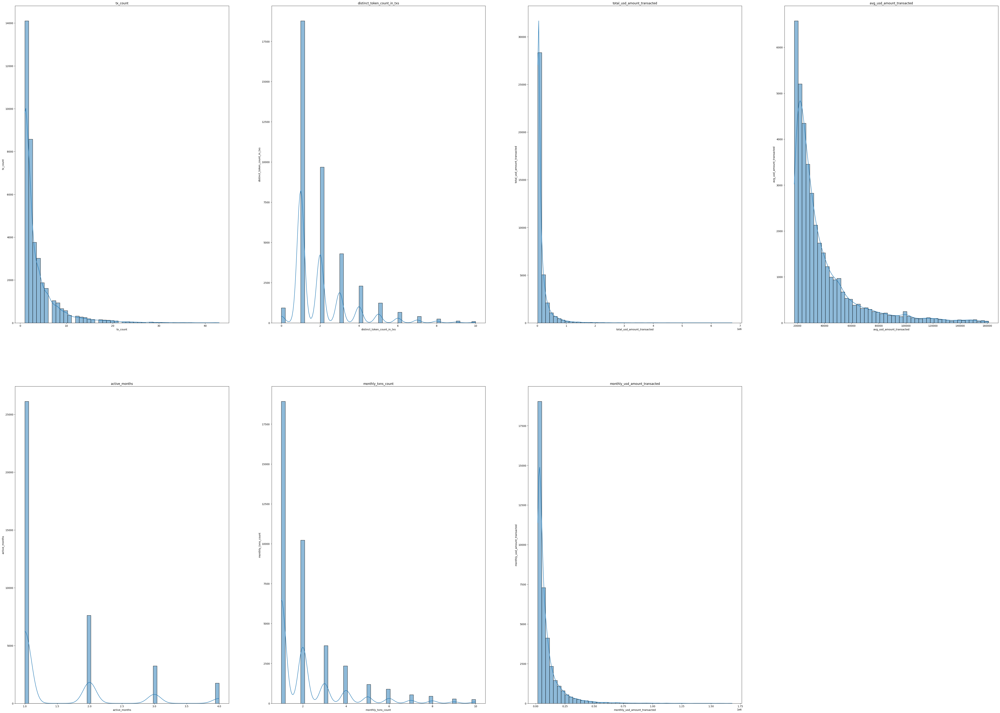

In [ ]:
#quick validation of sample chosen
plot_distrib(X_sample)

##K-means complete evaluation metrics (ellbow, silhouette)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[]

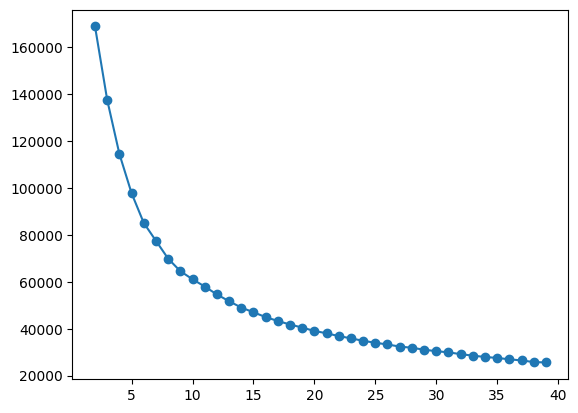

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans

#ellbow method
ss = [] #the sum of squares
clusters = 40

for cluster_number in range(2, clusters):
    kmeans_sample_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters =cluster_number, random_state = 42))])
    kmeans_sample_pipeline.fit(X_sample)
    ss.append(kmeans_sample_pipeline.named_steps["cluster"].inertia_)

plt.plot(range(2,clusters), ss, marker = "o")
plt.plot()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[]

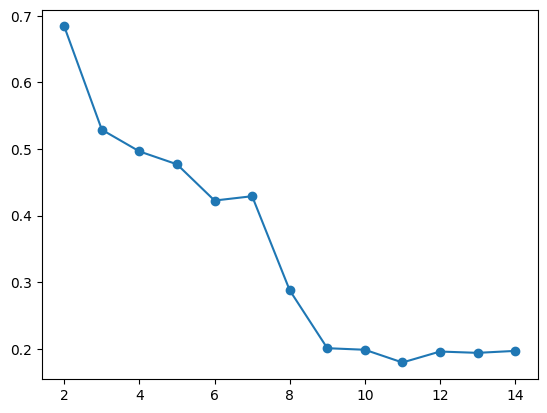

In [ ]:
#silhouette score
from sklearn.metrics import silhouette_score, silhouette_samples

silhouette = [] #the sum of squares
clusters = 15

for cluster_number in range(2, clusters):
    kmeans_sample_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters =cluster_number, random_state = 42))])
    kmeans_sample_pipeline.fit(X_sample)
    cluster_labels = kmeans_sample_pipeline.predict(X_sample)
    silhouette.append(silhouette_score(X_sample,cluster_labels))


plt.plot(range(2,clusters), silhouette, marker = "o")
plt.plot()



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[]

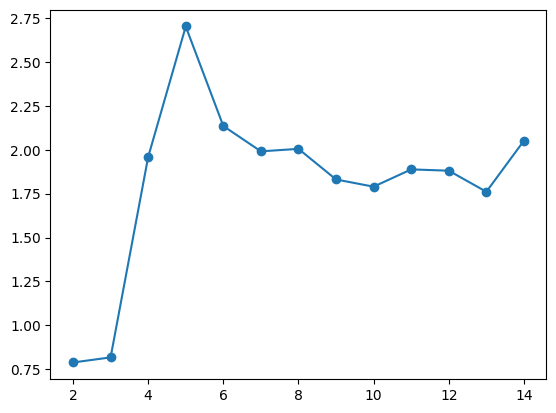

In [ ]:
# davies_bouldin_score

from sklearn.metrics import davies_bouldin_score

dbi = []
for k in range(2,15):
    kmeans_sample_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters =k, random_state = 42, verbose=0))])
    kmeans_sample_pipeline.fit(X_sample)
    cluster_labels = kmeans_sample_pipeline.predict(X_sample)
    dbi.append(davies_bouldin_score(X_sample, cluster_labels))

plt.plot(range(2,15), dbi, marker = "o")
plt.plot()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[]

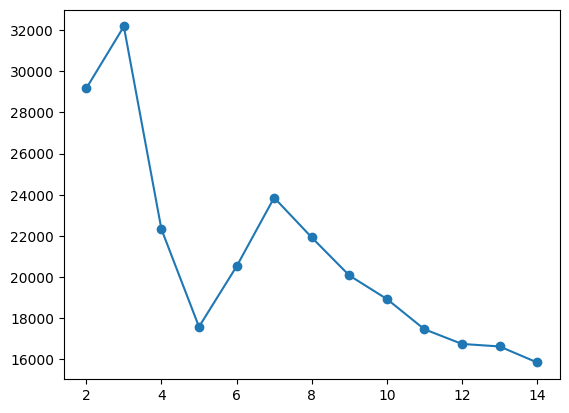

In [ ]:
from sklearn.metrics import calinski_harabasz_score

chi = []

for k in range(2,15):
    kmeans_sample_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters =k, random_state = 42, verbose=0))])
    kmeans_sample_pipeline.fit(X_sample)
    cluster_labels = kmeans_sample_pipeline.predict(X_sample)
    chi.append(calinski_harabasz_score(X_sample, cluster_labels))

plt.plot(range(2,15), chi, marker = "o")
plt.plot()



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 2 The average silhouette_score is : 0.684


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 3 The average silhouette_score is : 0.5296


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 4 The average silhouette_score is : 0.4957


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 5 The average silhouette_score is : 0.477


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 6 The average silhouette_score is : 0.4225


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 7 The average silhouette_score is : 0.429


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 8 The average silhouette_score is : 0.2877


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 9 The average silhouette_score is : 0.2008


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 10 The average silhouette_score is : 0.1971


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 11 The average silhouette_score is : 0.2429


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 12 The average silhouette_score is : 0.1905


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 13 The average silhouette_score is : 0.1942


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 14 The average silhouette_score is : 0.1968




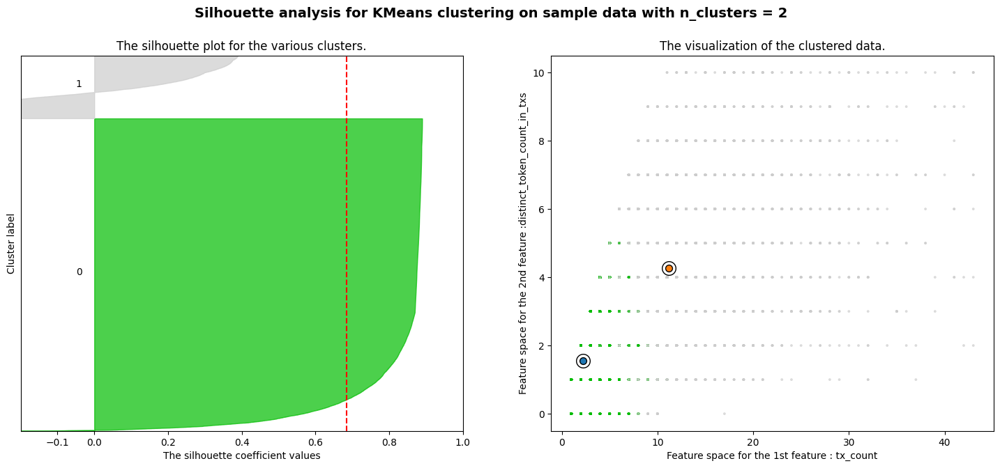

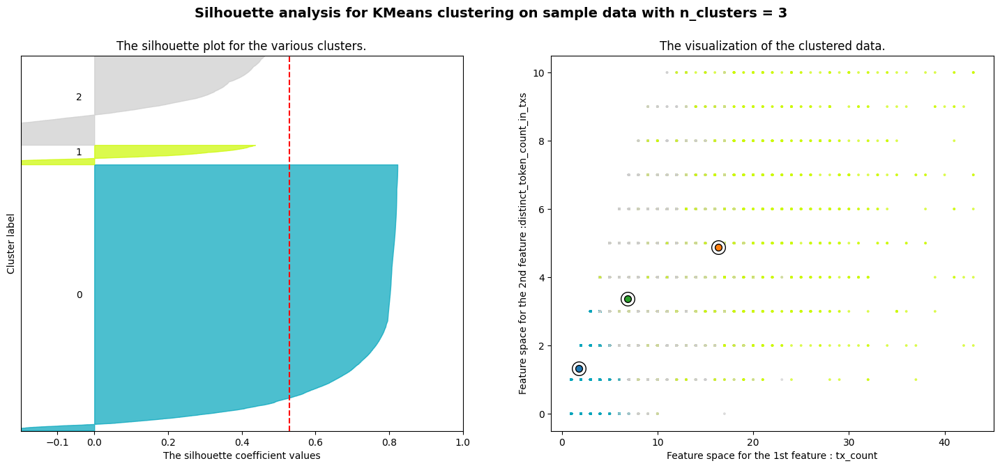

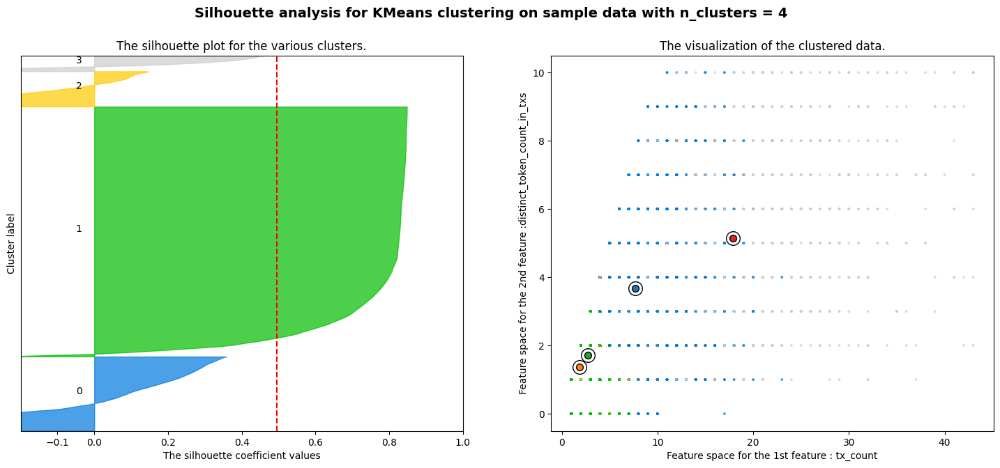

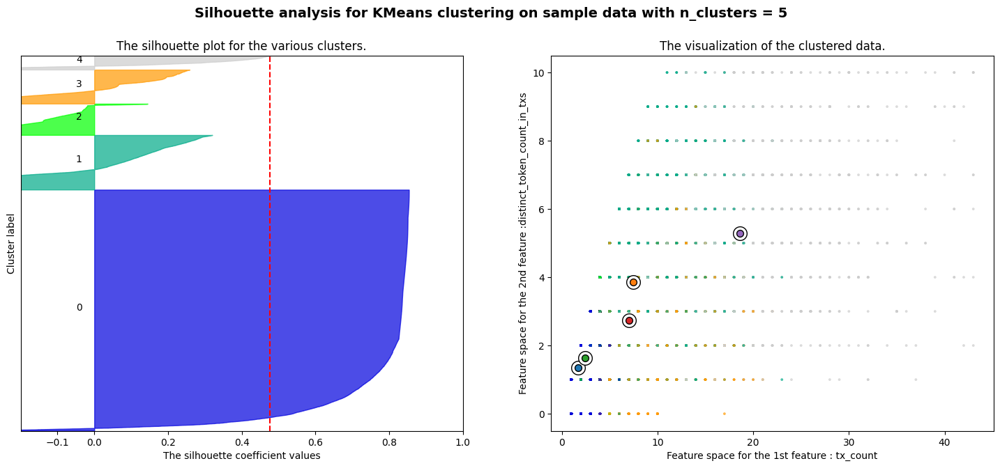

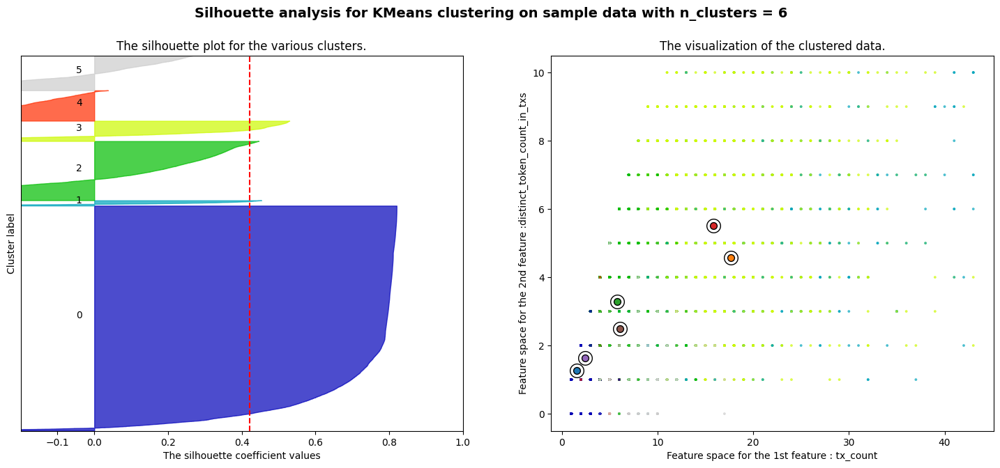

...

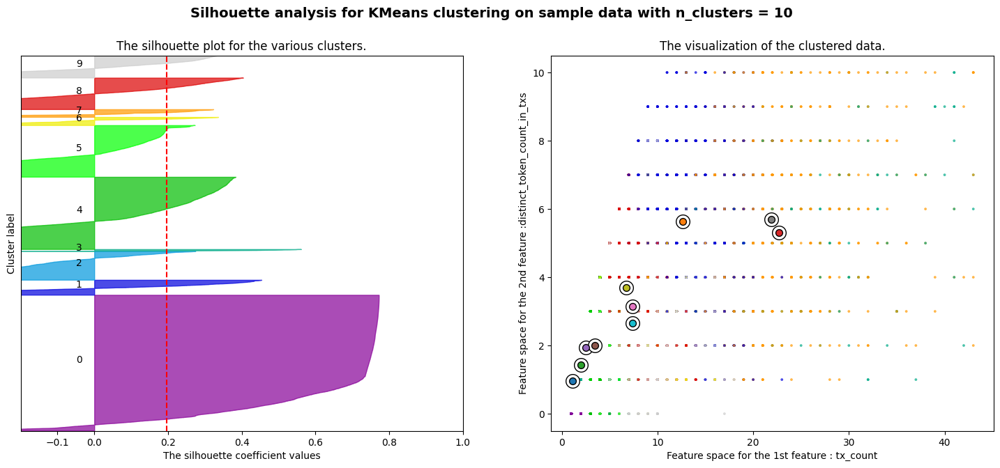

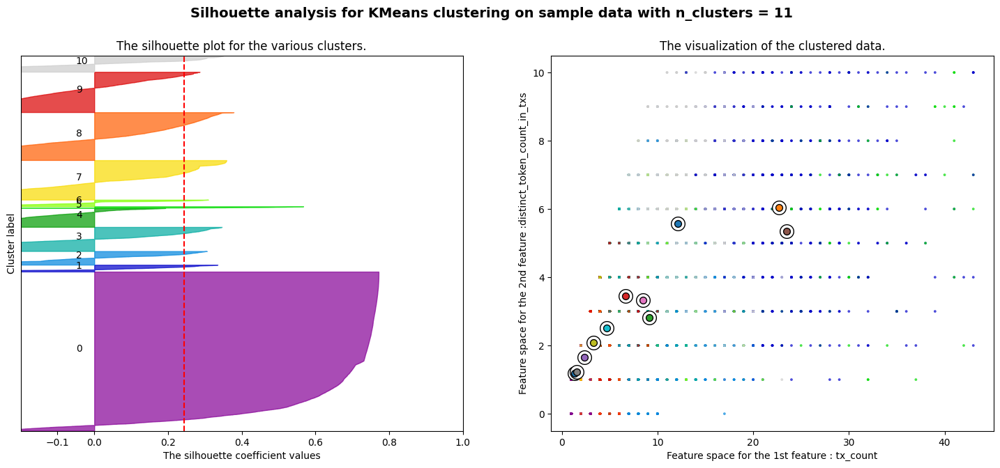

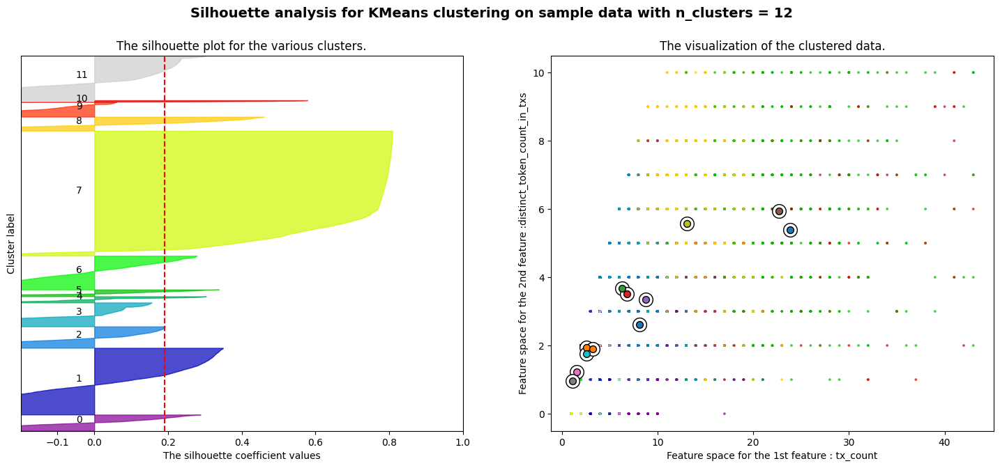

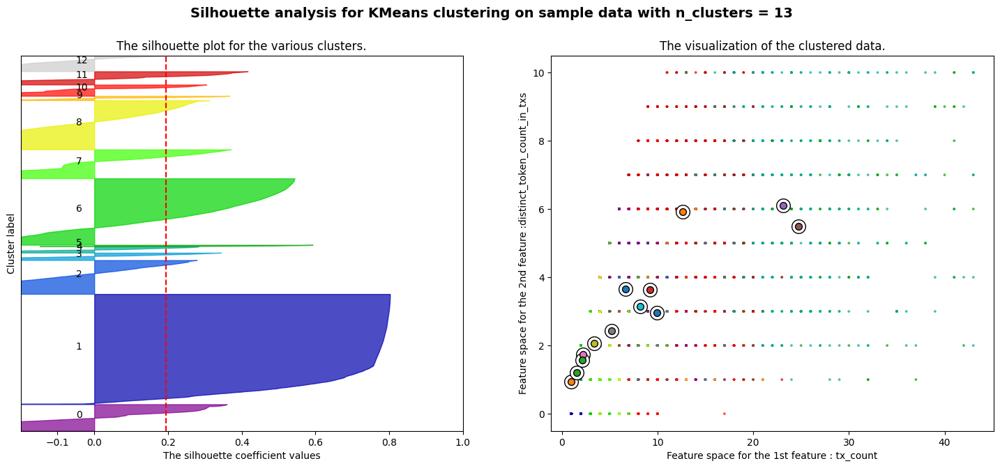

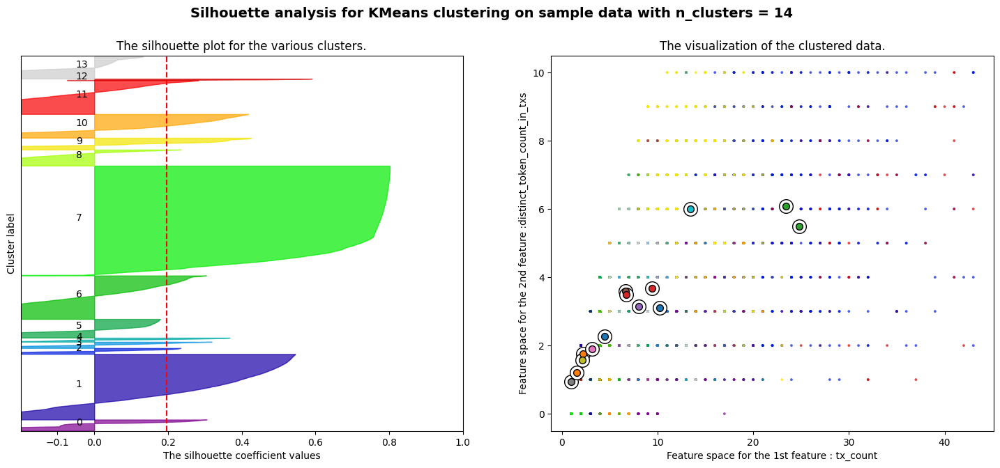

In [ ]:
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm


range_n_clusters = range(2, 15)

r_seed = 17

cols = X_sample.columns

for n_clusters in range_n_clusters:

    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot

    # The silhouette coefficient can range from -1, 1 but in this example all lie within [-0.2, 1]
    ax1.set_xlim([-0.2, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X_sample) + (n_clusters + 1) * 10])

    # Initialize the Pipeline with n_clusters value and a random generator seed for reproducibility.
    kmeans_pipeline = Pipeline([
            ("scaler", StandardScaler()),
            ("cluster", KMeans(n_clusters=n_clusters, random_state=r_seed, verbose=0))])

    cluster_labels = kmeans_pipeline.fit_predict(X_sample)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(X_sample, cluster_labels)
    print("For n_clusters =",
          n_clusters,
          "The average silhouette_score is :",
          silhouette_avg.round(4))

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_sample, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i + 1) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0,
                          ith_cluster_silhouette_values,
                          facecolor=color,
                          edgecolor=color,
                          alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral((cluster_labels.astype(float) + 1) / n_clusters)
    ax2.scatter(X_sample.iloc[:, 0],
                X_sample.iloc[:, 1],
                marker=".",
                s=30,
                lw=0,
                alpha=0.7,
                c=colors,
                edgecolor="k")

    # Labeling the clusters
    pipeline_centers = kmeans_pipeline.named_steps["cluster"].cluster_centers_
    centers = kmeans_pipeline.named_steps["scaler"].inverse_transform(pipeline_centers)
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature : " + cols[0])
    ax2.set_ylabel("Feature space for the 2nd feature :" + cols[1])

    plt.suptitle(
        (
            "Silhouette analysis for KMeans clustering on sample data "
            "with n_clusters = %d" % n_clusters
        ),
        fontsize=14,
        fontweight="bold",
    )
print("\n")
plt.show()

**Insights**:

*   Either cluster sizes of around 3 or 10 across the different scores perform well in K-means.



##T-SNE

consider pca before t-sne before. try different perplexity levels, try to increase exageration, do eda and look at correlation of features, consider just looking at one protocol.

In [ ]:
from sklearn.manifold import TSNE
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

low perplexity

In [ ]:
t_sne_pipeline = Pipeline([("scaler", StandardScaler()),("tsne", TSNE(n_components=2, perplexity=30, n_iter=5000))])

X_tsne = t_sne_pipeline.fit_transform(X_sample)


<ipython-input-148-05a80bce6429>:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)


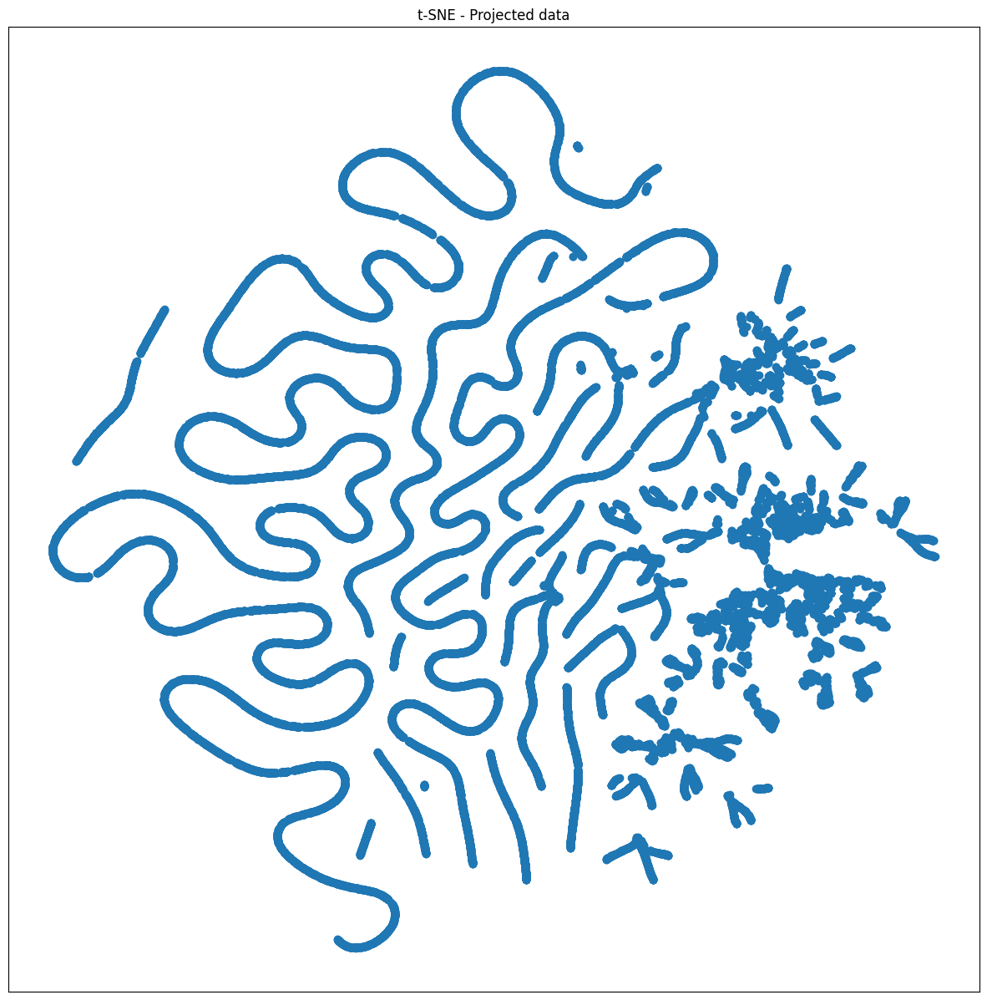

In [ ]:
fig = plt.figure(figsize =(15, 15))

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

medium perplexity value

In [ ]:
t_sne_pipeline = Pipeline([("scaler", StandardScaler()),("tsne", TSNE(n_components=2, perplexity=50, n_iter=5000))])

X_tsne = t_sne_pipeline.fit_transform(X_sample)

<ipython-input-150-a53af4348cd6>:5: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)


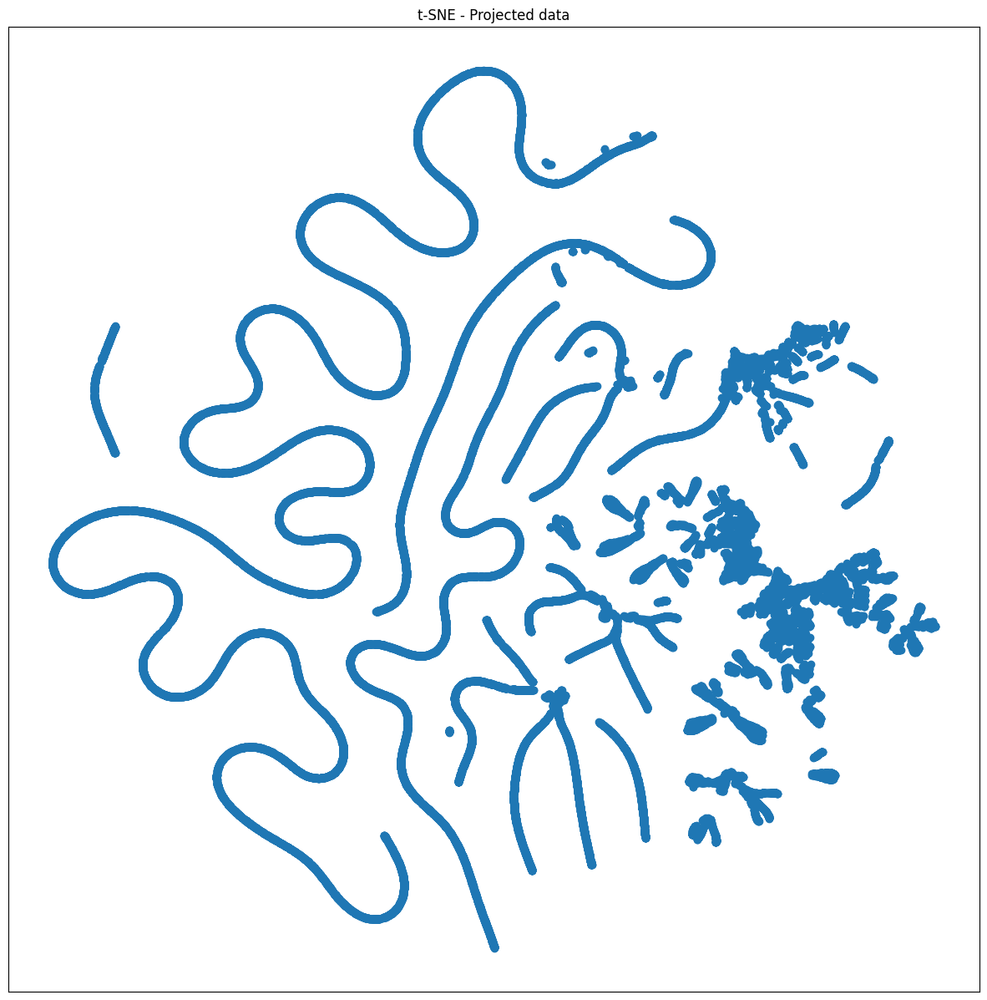

In [ ]:
fig = plt.figure(figsize =(15, 15))

# plot projected roll
ax = fig.add_subplot()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

In [ ]:
#med high

t_sne_pipeline = Pipeline([("scaler", StandardScaler()),("tsne", TSNE(n_components=2, perplexity=100, n_iter=5000))])

X_tsne = t_sne_pipeline.fit_transform(X_sample)



<ipython-input-152-05a80bce6429>:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)


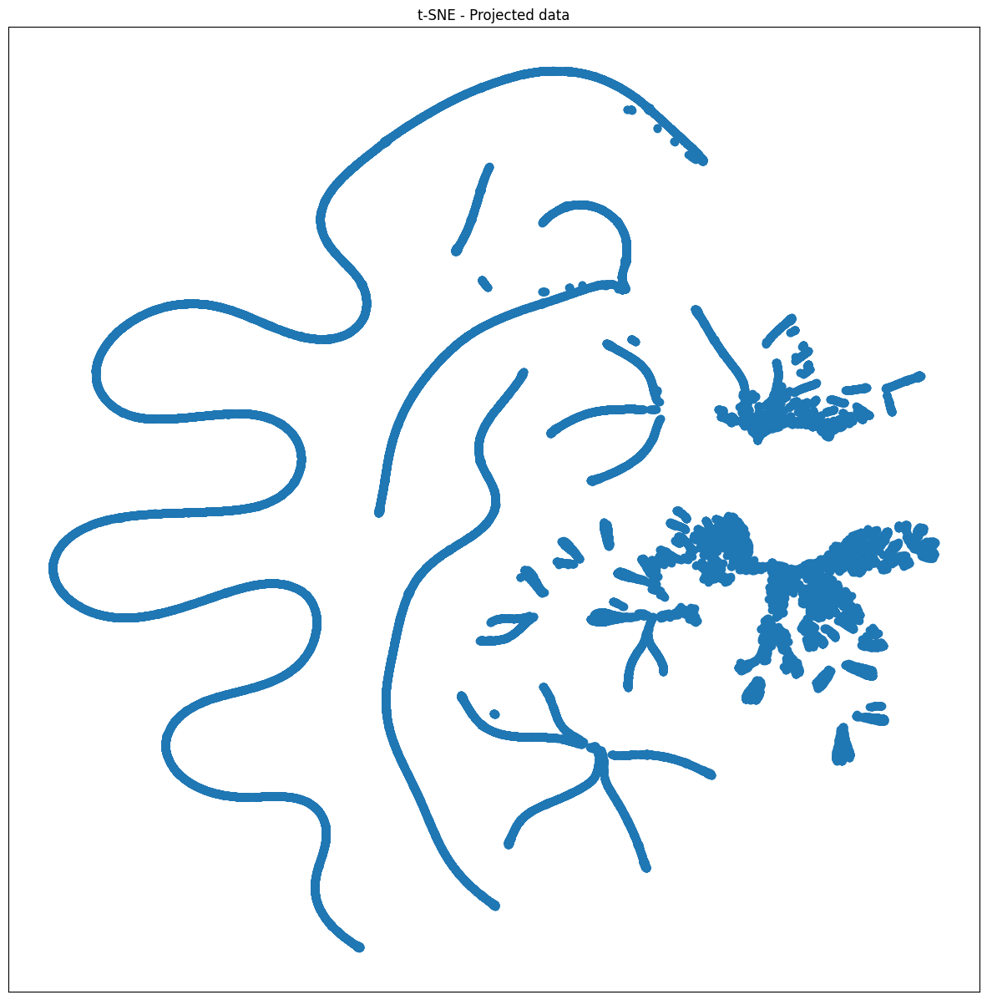

In [ ]:
fig = plt.figure(figsize =(15, 15))

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

High perplexity value

In [ ]:


#p = 200

t_sne_pipeline = Pipeline([("scaler", StandardScaler()),("tsne", TSNE(n_components=2, perplexity=200, n_iter=5000))])

X_tsne = t_sne_pipeline.fit_transform(X_sample)


<ipython-input-154-05a80bce6429>:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)


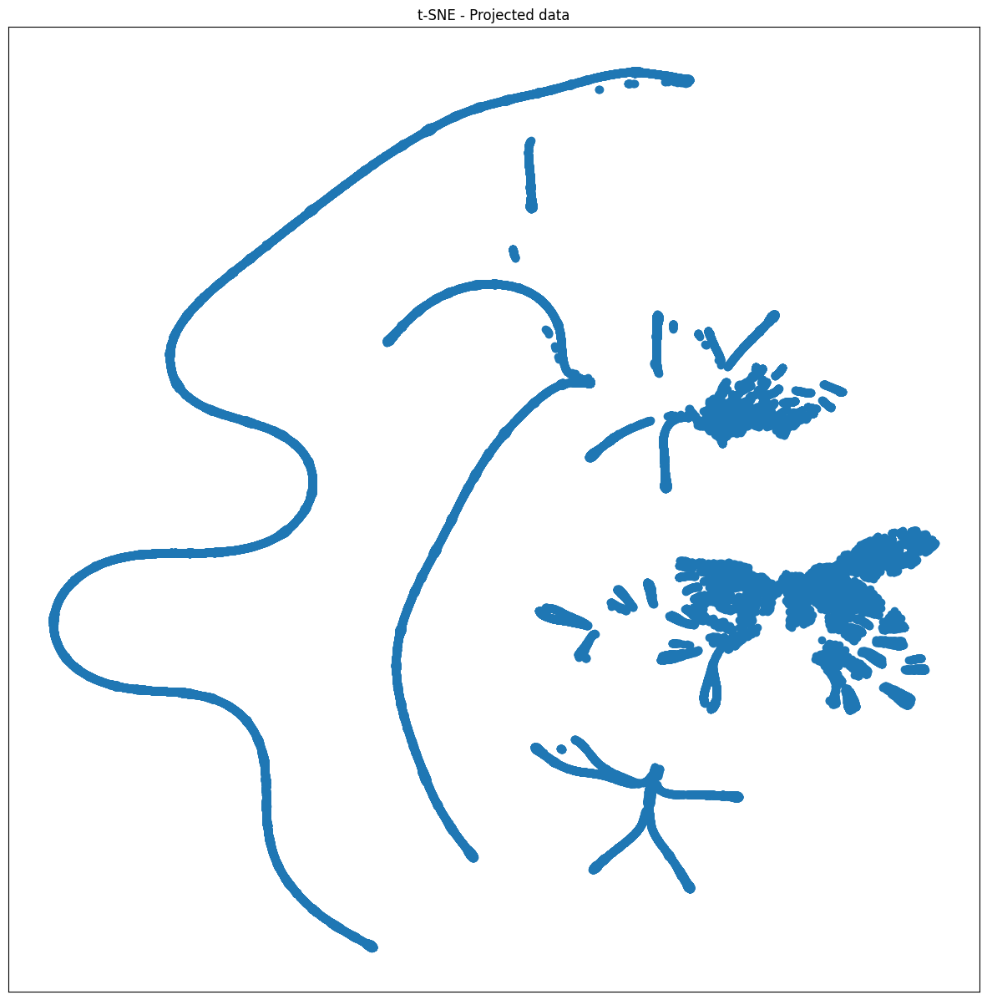

In [ ]:


fig = plt.figure(figsize =(15, 15))

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()


###PCA to reduce sample on the main principal components and then visualize it using perplexity 200 -> this seems to be valid with dbscan cluster amounts of 130+ clusters


In [ ]:
from sklearn.decomposition import PCA
import numpy as np

pca_pipe = Pipeline([("sclaer", StandardScaler()),("pca", PCA())])

X_sample_pca = pca_pipe.fit_transform(X_sample)

cum_sum_explained_variance_ratio_pca = np.cumsum(pca_pipe.named_steps["pca"].explained_variance_ratio_)

cum_sum_explained_variance_ratio_pca

array([0.58694059, 0.77788115, 0.90580454, 0.95631071, 0.98242403,
       0.99632138, 1.        ])

In [ ]:
#index in the cumsum array (above) that explains more than 95% of variance, used
location_ncomp = np.argmax(cum_sum_explained_variance_ratio_pca > 0.95) #In case of multiple occurrences of the maximum values, the indices corresponding to the first occurrence are returned. First True value is the max value.
location_ncomp

3

In [ ]:
cum_sum_explained_variance_ratio_pca[3]

IndexError: ignored

In [ ]:
plt.plot(cum_sum_explained_variance_ratio_pca)
plt.xlabel("Number of Components")
plt.ylabel("Explained variance ratio")
plt.axvline(x=location_ncomp, color = "red")
plt.axhline(y=0.95, color = "red")

In [ ]:
#tsne and pca with n_princ_comp = 10

tsne_pca_pipeline = Pipeline([("scaler", StandardScaler()),("pca", PCA(n_components = 10)), ("tsne",TSNE(n_components=2, perplexity=200, n_iter=5000))])

tsne_pca = tsne_pca_pipeline.fit_transform(X_sample)

In [ ]:
fig = plt.figure(figsize =(15, 15))

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
ax.scatter(tsne_pca[:, 0], tsne_pca[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

In [ ]:
#p = 500

t_sne_pipeline = Pipeline([("scaler", StandardScaler()),("tsne", TSNE(n_components=2, perplexity=500, n_iter=5000))])

X_tsne = t_sne_pipeline.fit_transform(X_sample)


In [ ]:

fig = plt.figure(figsize =(15, 15))

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

Very high perplexitiy value: high amount of neighrest neighbours < sample size

In [ ]:

#p = 1000

t_sne_pipeline = Pipeline([("scaler", StandardScaler()),("tsne", TSNE(n_components=2, perplexity=1000, n_iter=5000))])

X_tsne = t_sne_pipeline.fit_transform(X_sample)

In [ ]:


fig = plt.figure(figsize =(15, 15))

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

##UMAP

###UMAP for visualization

In [ ]:
!pip install umap-learn



In [ ]:
from sklearn.manifold import TSNE
from umap import UMAP



In [ ]:
#focus on local structure
umap_embeddings_local = UMAP(n_neighbors=15, n_components=2,  min_dist= 0.01)
#focus on global structure
umap_embeddings_global = UMAP(n_neighbors=100, n_components=2,  min_dist= 0.5)

#fit transform data set
X_umap_local = umap_embeddings_local.fit_transform(X_sample)
X_umap_global = umap_embeddings_global.fit_transform(X_sample)

In [ ]:
fig = plt.figure(figsize =(15, 15))
plt.scatter(X_umap_local[:, 0], X_umap_local[:, 1],cmap=plt.cm.Spectral)
plt.title('Local Focus UMAP - Projected data')

In [ ]:
fig = plt.figure(figsize =(15, 15))
plt.scatter(X_umap_global[:, 0], X_umap_global[:, 1],cmap=plt.cm.Spectral)
plt.title('Gloabl Focus UMAP - Projected data')

#### Use pca to reduce noise and keep most of the variance

In [ ]:

umap_local_pca_embeddings = Pipeline([("scaler", StandardScaler()),("pca", PCA(n_components = 10)), ("umap",UMAP(n_neighbors=15, n_components=2,  min_dist= 0.01))])

umap_global_pca_embeddings =  Pipeline([("scaler", StandardScaler()),("pca", PCA(n_components = 10)), ("umap", UMAP(n_neighbors=100, n_components=2,  min_dist= 0.5))])


#fit transform data set
X_umap_pca_local = umap_local_pca_embeddings.fit_transform(X_sample)
X_umap_pca_global = umap_global_pca_embeddings.fit_transform(X_sample)



In [ ]:
fig = plt.figure(figsize =(15, 15))
plt.scatter(X_umap_pca_local[:, 0], X_umap_pca_local[:, 1],cmap=plt.cm.Spectral)
plt.title('Local Focus UMAP after pca - Projected data')

In [ ]:
fig = plt.figure(figsize =(15, 15))
plt.scatter(X_umap_pca_global[:, 0], X_umap_pca_global[:, 1],cmap=plt.cm.Spectral)
plt.title('Global Focus UMAP after pca - Projected data')

###UMAP for dimensionality reduction and clustering, visualize it with t-sne

##DBSCAN

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN

# Define the pipeline
dbscan_pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("dbscan", DBSCAN(eps=0.5, min_samples=5))
])

# Fit the data
dbscan_pipeline.fit(X_sample)

# Get cluster labels from the 'dbscan' step of the pipeline
cluster_labels = dbscan_pipeline.named_steps['dbscan'].labels_

# Number of clusters in labels, ignoring noise (outliers) if present
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
n_noise = list(cluster_labels).count(-1)

print(f"Estimated number of clusters: {n_clusters}")
print(f"Estimated number of noise points: {n_noise}")

# Add to your dataframe if desired
#X_sample["dbscan_cluster_labels"] = cluster_labels


Estimated number of clusters: 235
Estimated number of noise points: 1899


**use dbscan clusters on tsne sample with perplexitiy level of 200**


**could we maybe use sankey diagram to visualize any flows between addresses?**

##Birch



In [ ]:
#great for large datasets, but needs to have data set with only numerical features!My dataset does only contain numerical features after the EDA


from sklearn.pipeline import Pipeline
from sklearn.cluster import Birch

# Define the pipeline
birch_pipeline = Pipeline([
    ("birch", Birch(n_clusters=12, threshold=0.5, branching_factor=50))
])

# Fit the data
birch_pipeline.fit(X_sample)

# Get cluster labels from the 'birch' step of the pipeline
birch_cluster_labels = birch_pipeline.named_steps['birch'].labels_




##Agglomerative hirarchical clustering with metrics


In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score, calinski_harabasz_score


silhouette = []
dbi = []
chi = []

#cluster my data
for k in range(2,15):
  aggloclustering_pipeline = Pipeline([("scaler", StandardScaler()),("cluster",AgglomerativeClustering(n_clusters=k))])
  # Fit the data
  aggloclustering_pipeline.fit(X_sample)
  cluster_labels = aggloclustering_pipeline.named_steps["cluster"].labels_
  #ss.append(aggloclustering_pipeline.named_steps["cluster"].inertia_) - no intertia attribute for aggloclustering, would have to calculate it manually
  silhouette.append(silhouette_score(X_sample, cluster_labels))
  dbi.append(davies_bouldin_score(X_sample, cluster_labels))
  chi.append(calinski_harabasz_score(X_sample, cluster_labels))



ValueError: ignored

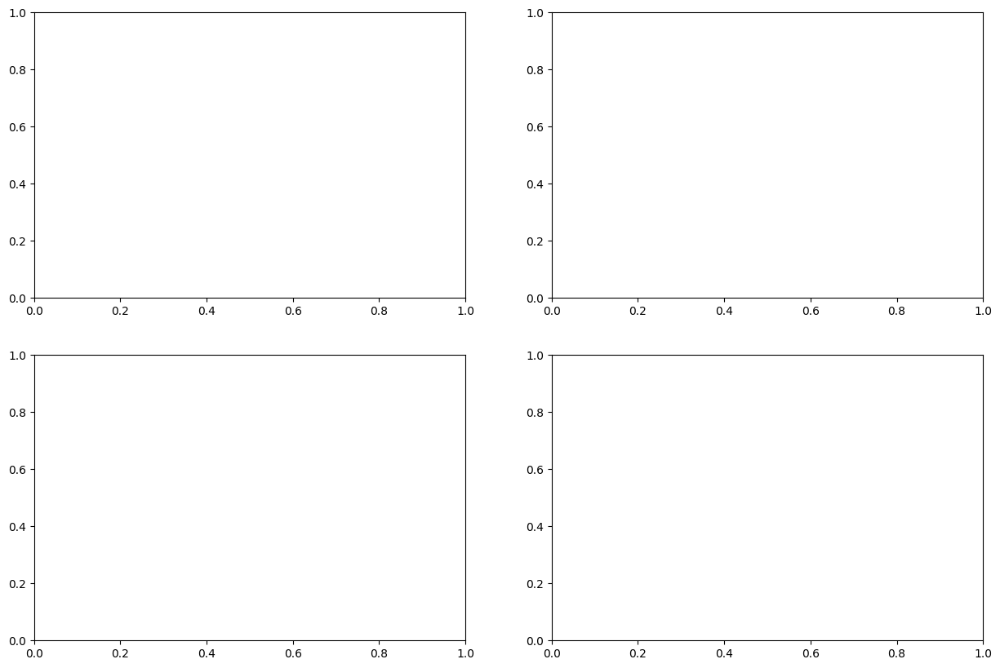

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(15, 10))



# Plot Silhouette Score
axs[0, 1].plot(range(2, 15), silhouette, marker='o', linestyle='--')
axs[0, 1].set_title('Silhouette Score')
axs[0, 1].set_xlabel('Number of Clusters')
axs[0, 1].set_ylabel('Silhouette Score')

# Plot Davies-Bouldin Index
axs[1, 1].plot(range(2, 15), dbi, marker='o', linestyle='--')
axs[1, 1].set_title('Davies-Bouldin Index')
axs[1, 1].set_xlabel('Number of Clusters')
axs[1, 1].set_ylabel('DBI')

# Plot Calinski-Harabasz Index
axs[1, 2].plot(range(2, 15), chi, marker='o', linestyle='--')
axs[1, 2].set_title('Calinski-Harabasz Index')
axs[1, 2].set_xlabel('Number of Clusters')
axs[1, 2].set_ylabel('CHI')

# Adjust layout
plt.tight_layout()
plt.show()

hirarchical clustering using scipy and dendrograms

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Generate some data (replace with your data)


# Perform hierarchical clustering
linked = linkage(X_sample, 'ward')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linked,leaf_rotation = 90)
plt.title('Dendrogram')
plt.ylabel('Euclidean distances')
plt.show()


NameError: ignored